In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)     

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

C:\Users\User\AppData\Local\Temp\ipykernel_830484\126821524.py:375: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1972)
(11, 1, 1, 1972)
(10, 1, 1, 1972)
(84, 1, 1972)
(11, 1, 1972)
(10, 1, 1972)
(84, 1972)
(11, 1972)
(10, 1972)
[[0.39307412 0.69695044 0.32924264 ... 0.45747266 0.31713244 0.95078979]
 [0.45747266 0.51683609 0.42215989 ... 0.5246051  0.60753341 0.55194411]
 [0.38487242 0.62674714 0.3411641  ... 0.4954435  0.36968408 0.88061968]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.4936209  0.51123937 0.49696233]
 [0.44896719 0.51620076 0.3997195  ... 0.54009721 0.55103281 0.59629405]
 [0.46780073 0.52414231 0.42356241 ... 0.49696233 0.58961118 0.50880923]]
Fold 2:
(84, 1, 1, 1972)
(11, 1, 1, 1972)
(10, 1, 1, 1972)
(84, 1, 1972)
(11, 1, 1972)
(10, 1, 1972)
(84, 1972)
(11, 1972)
(10, 1972)
[[0.38166311 0.62313675 0.34639831 ... 0.47852574 0.40268048 0.84191288]
 [0.39415169 0.71548931 0.32450565 ... 0.45872677 0.31800183 0.95339628]
 [0.45872677 0.53175632 0.4180791  ... 0.52604325 0.6091989  0.5534572 ]
 ...
 [0.54249162 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-22 01:46:28,465] A new study created in memory with name: no-name-f89ec924-ad9a-4477-94ea-542fad32f048
[I 2025-05-22 01:52:44,983] Trial 0 finished with value: 0.08790970146656037 and parameters: {'lr': 0.0033528030585830942, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4480308629613564}. Best is trial 0 with value: 0.08790970146656037.


Cross Validation Accuracies:
[0.07552520185709, 0.06365182995796204, 0.10198848694562912, 0.11358434706926346, 0.08479864150285721]
Mean Cross Validation Accuracy:
0.08790970146656037
Standard Deviation of Cross Validation Accuracy:
0.01793821887586632


[I 2025-05-22 01:59:54,412] Trial 1 finished with value: 0.10653577446937561 and parameters: {'lr': 0.23442202447749827, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4647245708866352}. Best is trial 0 with value: 0.08790970146656037.


Cross Validation Accuracies:
[0.06674840301275253, 0.08509530872106552, 0.14154936373233795, 0.12515181303024292, 0.11413398385047913]
Mean Cross Validation Accuracy:
0.10653577446937561
Standard Deviation of Cross Validation Accuracy:
0.02710339318058159


[I 2025-05-22 02:05:02,443] Trial 2 finished with value: 0.09366273432970047 and parameters: {'lr': 0.004135236025512591, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4030876291007075}. Best is trial 0 with value: 0.08790970146656037.


Cross Validation Accuracies:
[0.0642029196023941, 0.06608345359563828, 0.13721901178359985, 0.10829878598451614, 0.09250950068235397]
Mean Cross Validation Accuracy:
0.09366273432970047
Standard Deviation of Cross Validation Accuracy:
0.027353941840635325


[I 2025-05-22 02:13:28,607] Trial 3 finished with value: 0.19526601135730742 and parameters: {'lr': 0.06995171645042438, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.20077130262709253}. Best is trial 0 with value: 0.08790970146656037.


Cross Validation Accuracies:
[0.16466280817985535, 0.23489169776439667, 0.20932650566101074, 0.14438046514987946, 0.22306858003139496]
Mean Cross Validation Accuracy:
0.19526601135730742
Standard Deviation of Cross Validation Accuracy:
0.034833231850414065


[I 2025-05-22 02:20:31,176] Trial 4 finished with value: 0.07853899300098419 and parameters: {'lr': 0.008663575820582508, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.29873396494652815}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06150340661406517, 0.060546960681676865, 0.08885558694601059, 0.10247880965471268, 0.07931020110845566]
Mean Cross Validation Accuracy:
0.07853899300098419
Standard Deviation of Cross Validation Accuracy:
0.016087673072951853


[I 2025-05-22 02:27:16,803] Trial 5 finished with value: 0.13894448876380922 and parameters: {'lr': 0.018495972757191708, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2795783071805724}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.12329995632171631, 0.09681062400341034, 0.08413313329219818, 0.18975676596164703, 0.20072196424007416]
Mean Cross Validation Accuracy:
0.13894448876380922
Standard Deviation of Cross Validation Accuracy:
0.047796741800806904


[I 2025-05-22 02:34:20,567] Trial 6 finished with value: 0.08307392448186875 and parameters: {'lr': 0.0072561540269605995, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4416185079682967}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0721333846449852, 0.059900663793087006, 0.08703833073377609, 0.10038743168115616, 0.09590981155633926]
Mean Cross Validation Accuracy:
0.08307392448186875
Standard Deviation of Cross Validation Accuracy:
0.015079320066443124


[I 2025-05-22 02:38:16,740] Trial 7 finished with value: 7.813338136672973 and parameters: {'lr': 0.09747893605900093, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4342149484534795}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[8.38543701171875, 7.099316596984863, 9.690658569335938, 3.266399621963501, 10.624878883361816]
Mean Cross Validation Accuracy:
7.813338136672973
Standard Deviation of Cross Validation Accuracy:
2.5667437392813923


[I 2025-05-22 02:43:48,778] Trial 8 finished with value: 0.08695469647645951 and parameters: {'lr': 0.012969804419412827, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.12740332758692552}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06257985532283783, 0.09056802093982697, 0.08349378407001495, 0.10673025250434875, 0.09140156954526901]
Mean Cross Validation Accuracy:
0.08695469647645951
Standard Deviation of Cross Validation Accuracy:
0.014352799071464984


[I 2025-05-22 02:54:02,932] Trial 9 finished with value: 0.09798014163970947 and parameters: {'lr': 0.001303164494094173, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23826963662672174}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.11231417208909988, 0.06485813111066818, 0.09043154865503311, 0.11172202229499817, 0.11057483404874802]
Mean Cross Validation Accuracy:
0.09798014163970947
Standard Deviation of Cross Validation Accuracy:
0.018476898155701187


[I 2025-05-22 02:58:12,397] Trial 10 finished with value: 0.10034258216619492 and parameters: {'lr': 0.5823237250430475, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3484613675868246}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.08548914641141891, 0.07239440083503723, 0.098822683095932, 0.1391901671886444, 0.10581651329994202]
Mean Cross Validation Accuracy:
0.10034258216619492
Standard Deviation of Cross Validation Accuracy:
0.02255275712970706


[I 2025-05-22 03:04:51,779] Trial 11 finished with value: 0.08835592120885849 and parameters: {'lr': 0.007614981187144919, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.33723326646029844}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.08452990651130676, 0.06319499015808105, 0.10752061009407043, 0.10032892972230911, 0.08620516955852509]
Mean Cross Validation Accuracy:
0.08835592120885849
Standard Deviation of Cross Validation Accuracy:
0.01525106426056488


[I 2025-05-22 03:12:11,895] Trial 12 finished with value: 0.09906455427408219 and parameters: {'lr': 0.03252333282557506, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3718353174578354}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06621450185775757, 0.07043543457984924, 0.15127913653850555, 0.12041378766298294, 0.08697991073131561]
Mean Cross Validation Accuracy:
0.09906455427408219
Standard Deviation of Cross Validation Accuracy:
0.03233247103182716


[I 2025-05-22 03:21:34,758] Trial 13 finished with value: 0.0934250883758068 and parameters: {'lr': 0.0013448804235354724, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.29207298225302525}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.09649065136909485, 0.06223928555846214, 0.11811912804841995, 0.10689905285835266, 0.08337732404470444]
Mean Cross Validation Accuracy:
0.0934250883758068
Standard Deviation of Cross Validation Accuracy:
0.01936105811215385


[I 2025-05-22 03:30:19,391] Trial 14 finished with value: 0.18121640384197235 and parameters: {'lr': 0.004808322662614772, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.48643317643614387}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.1581713855266571, 0.17139354348182678, 0.15835700929164886, 0.244932159781456, 0.173227921128273]
Mean Cross Validation Accuracy:
0.18121640384197235
Standard Deviation of Cross Validation Accuracy:
0.03247653548339912


[I 2025-05-22 03:34:22,903] Trial 15 finished with value: 0.1590612918138504 and parameters: {'lr': 0.036949375920549005, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18981027114614368}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.15008783340454102, 0.1734279841184616, 0.135319784283638, 0.14395344257354736, 0.19251741468906403]
Mean Cross Validation Accuracy:
0.1590612918138504
Standard Deviation of Cross Validation Accuracy:
0.020967323386237118


[I 2025-05-22 03:40:50,567] Trial 16 finished with value: 0.0964809775352478 and parameters: {'lr': 0.009548628124099111, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.31671428010523606}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07110566645860672, 0.06284622102975845, 0.14005254209041595, 0.12988580763339996, 0.07851465046405792]
Mean Cross Validation Accuracy:
0.0964809775352478
Standard Deviation of Cross Validation Accuracy:
0.031976103819947886


[I 2025-05-22 03:46:39,547] Trial 17 finished with value: 0.08525438979268074 and parameters: {'lr': 0.0025249967006883115, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25268143152285577}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06720073521137238, 0.05936482176184654, 0.10128910094499588, 0.11453808099031448, 0.08387921005487442]
Mean Cross Validation Accuracy:
0.08525438979268074
Standard Deviation of Cross Validation Accuracy:
0.020555981259829038


[I 2025-05-22 03:50:53,731] Trial 18 finished with value: 0.09628482013940812 and parameters: {'lr': 0.021474728559486976, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.39508796144219577}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.10489680618047714, 0.06937066465616226, 0.11015021055936813, 0.11385614424943924, 0.08315027505159378]
Mean Cross Validation Accuracy:
0.09628482013940812
Standard Deviation of Cross Validation Accuracy:
0.017158408003596422


[I 2025-05-22 03:55:57,483] Trial 19 finished with value: 2.09303879737854 and parameters: {'lr': 0.06968467968804208, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10121040439418694}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[1.7706166505813599, 1.844436526298523, 2.6497609615325928, 2.1331796646118164, 2.067200183868408]
Mean Cross Validation Accuracy:
2.09303879737854
Standard Deviation of Cross Validation Accuracy:
0.30918525875668207


[I 2025-05-22 04:01:20,556] Trial 20 finished with value: 0.08587803840637206 and parameters: {'lr': 0.006826072300639642, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.40340900021897685}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.060635264962911606, 0.05950075015425682, 0.10644087195396423, 0.11924903839826584, 0.08356426656246185]
Mean Cross Validation Accuracy:
0.08587803840637206
Standard Deviation of Cross Validation Accuracy:
0.02397818279504799


[I 2025-05-22 04:07:27,170] Trial 21 finished with value: 0.08396916314959527 and parameters: {'lr': 0.002326892683099153, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2535339627172964}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06300832331180573, 0.060219522565603256, 0.10409355908632278, 0.10816501826047897, 0.08435939252376556]
Mean Cross Validation Accuracy:
0.08396916314959527
Standard Deviation of Cross Validation Accuracy:
0.019969903504542946


[I 2025-05-22 04:14:53,449] Trial 22 finished with value: 0.08414614647626877 and parameters: {'lr': 0.0020212203375048923, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21149061866756116}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0638357400894165, 0.05870945751667023, 0.10234130173921585, 0.11379998177289963, 0.08204425126314163]
Mean Cross Validation Accuracy:
0.08414614647626877
Standard Deviation of Cross Validation Accuracy:
0.021327772219131933


[I 2025-05-22 04:21:32,332] Trial 23 finished with value: 0.0816049925982952 and parameters: {'lr': 0.0048511208635331525, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2630932178087814}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06227240711450577, 0.05651843175292015, 0.08756496757268906, 0.11345929652452469, 0.0882098600268364]
Mean Cross Validation Accuracy:
0.0816049925982952
Standard Deviation of Cross Validation Accuracy:
0.020478899631598057


[I 2025-05-22 04:27:14,439] Trial 24 finished with value: 0.0817337952554226 and parameters: {'lr': 0.01210500283178461, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3129548422887121}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06327611953020096, 0.05987321957945824, 0.09597858786582947, 0.10533103346824646, 0.08421001583337784]
Mean Cross Validation Accuracy:
0.0817337952554226
Standard Deviation of Cross Validation Accuracy:
0.01780138195870729


[I 2025-05-22 04:34:23,314] Trial 25 finished with value: 0.08105574622750282 and parameters: {'lr': 0.015330343969078564, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31334565759823807}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06473646312952042, 0.060903940349817276, 0.09387630969285965, 0.10652418434619904, 0.07923783361911774]
Mean Cross Validation Accuracy:
0.08105574622750282
Standard Deviation of Cross Validation Accuracy:
0.017255302228537422


[I 2025-05-22 04:40:24,774] Trial 26 finished with value: 0.08130212277173995 and parameters: {'lr': 0.02178218618566849, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28341104566728914}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06116769090294838, 0.057614777237176895, 0.09857594966888428, 0.10331916809082031, 0.08583302795886993]
Mean Cross Validation Accuracy:
0.08130212277173995
Standard Deviation of Cross Validation Accuracy:
0.01881568583508186


[I 2025-05-22 04:46:35,251] Trial 27 finished with value: 0.07872148230671883 and parameters: {'lr': 0.020432062327901405, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1600677322933618}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06292811036109924, 0.05842384323477745, 0.09031765908002853, 0.1014101430773735, 0.0805276557803154]
Mean Cross Validation Accuracy:
0.07872148230671883
Standard Deviation of Cross Validation Accuracy:
0.016210698043254652


[I 2025-05-22 04:50:58,076] Trial 28 finished with value: 0.08190240561962128 and parameters: {'lr': 0.05785359891751437, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.14937061820958822}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06602558493614197, 0.06714116781949997, 0.0909024327993393, 0.10415008664131165, 0.08129275590181351]
Mean Cross Validation Accuracy:
0.08190240561962128
Standard Deviation of Cross Validation Accuracy:
0.014465815215632023


[I 2025-05-22 04:54:38,918] Trial 29 finished with value: 0.08128162920475006 and parameters: {'lr': 0.14314592600606915, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.16368479841742492}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.061043914407491684, 0.059930142015218735, 0.0975668728351593, 0.10796253383159637, 0.07990468293428421]
Mean Cross Validation Accuracy:
0.08128162920475006
Standard Deviation of Cross Validation Accuracy:
0.019206389136223884


[I 2025-05-22 04:59:58,203] Trial 30 finished with value: 0.08448814153671265 and parameters: {'lr': 0.0395416324317368, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22317723938310277}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06307435780763626, 0.06535172462463379, 0.09977737069129944, 0.10965155810117722, 0.08458569645881653]
Mean Cross Validation Accuracy:
0.08448814153671265
Standard Deviation of Cross Validation Accuracy:
0.018394130390587196


[I 2025-05-22 05:04:08,388] Trial 31 finished with value: 0.08251421302556991 and parameters: {'lr': 0.17960764378935107, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17012451736680198}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06596944481134415, 0.06909675151109695, 0.10169973224401474, 0.09794624149799347, 0.07785889506340027]
Mean Cross Validation Accuracy:
0.08251421302556991
Standard Deviation of Cross Validation Accuracy:
0.014708237586731624


[I 2025-05-22 05:07:35,753] Trial 32 finished with value: 0.1603267550468445 and parameters: {'lr': 0.9732765347861272, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1629246661206767}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.14945849776268005, 0.1383088231086731, 0.16341271996498108, 0.19310547411441803, 0.15734826028347015]
Mean Cross Validation Accuracy:
0.1603267550468445
Standard Deviation of Cross Validation Accuracy:
0.018416011389391942


[I 2025-05-22 05:12:11,013] Trial 33 finished with value: 0.08782457858324051 and parameters: {'lr': 0.19398119157366553, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1320045578618628}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06761304289102554, 0.07628846913576126, 0.10822220146656036, 0.09923124313354492, 0.08776793628931046]
Mean Cross Validation Accuracy:
0.08782457858324051
Standard Deviation of Cross Validation Accuracy:
0.01474968623411811


[I 2025-05-22 05:16:11,777] Trial 34 finished with value: 0.08140598088502884 and parameters: {'lr': 0.015531152014651486, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1893949284168805}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06262101978063583, 0.056586481630802155, 0.09724375605583191, 0.10693255066871643, 0.08364609628915787]
Mean Cross Validation Accuracy:
0.08140598088502884
Standard Deviation of Cross Validation Accuracy:
0.019371841994143518


[I 2025-05-22 05:21:06,547] Trial 35 finished with value: 0.0819229707121849 and parameters: {'lr': 0.10883010916359302, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.33974504946261597}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06865272670984268, 0.06401136517524719, 0.09744782745838165, 0.10192751884460449, 0.07757541537284851]
Mean Cross Validation Accuracy:
0.0819229707121849
Standard Deviation of Cross Validation Accuracy:
0.015212030431164491


[I 2025-05-22 05:26:28,519] Trial 36 finished with value: 0.08087693899869919 and parameters: {'lr': 0.02575621307496673, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10530648592618097}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.062005385756492615, 0.06320154666900635, 0.09516160190105438, 0.10324282199144363, 0.08077333867549896]
Mean Cross Validation Accuracy:
0.08087693899869919
Standard Deviation of Cross Validation Accuracy:
0.016570154284665108


[I 2025-05-22 05:32:17,698] Trial 37 finished with value: 0.09094305485486984 and parameters: {'lr': 0.027210974425709987, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.10782359445632758}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07742352038621902, 0.08220510184764862, 0.0862528532743454, 0.12358450144529343, 0.08524929732084274]
Mean Cross Validation Accuracy:
0.09094305485486984
Standard Deviation of Cross Validation Accuracy:
0.016607290785935938


[I 2025-05-22 05:39:29,990] Trial 38 finished with value: 0.09437584728002549 and parameters: {'lr': 0.05590186396192183, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13173342965313922}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0736759752035141, 0.07274473458528519, 0.11610328406095505, 0.12685969471931458, 0.0824955478310585]
Mean Cross Validation Accuracy:
0.09437584728002549
Standard Deviation of Cross Validation Accuracy:
0.02264867814651405


[I 2025-05-22 05:43:32,418] Trial 39 finished with value: 0.1003923088312149 and parameters: {'lr': 0.010856594107397326, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3699332231217523}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07967542111873627, 0.08438307046890259, 0.13390867412090302, 0.11665074527263641, 0.08734363317489624]
Mean Cross Validation Accuracy:
0.1003923088312149
Standard Deviation of Cross Validation Accuracy:
0.021182240597104628


[I 2025-05-22 05:47:44,164] Trial 40 finished with value: 0.08628477603197098 and parameters: {'lr': 0.015495676947397766, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23353650127440323}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0674242451786995, 0.05950164794921875, 0.10904537886381149, 0.11022710055112839, 0.08522550761699677]
Mean Cross Validation Accuracy:
0.08628477603197098
Standard Deviation of Cross Validation Accuracy:
0.020810850862897034


[I 2025-05-22 05:52:11,377] Trial 41 finished with value: 0.08362383544445037 and parameters: {'lr': 0.024875793531532225, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.15332287884675816}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06836873292922974, 0.06005491316318512, 0.09732238948345184, 0.10817262530326843, 0.08420051634311676]
Mean Cross Validation Accuracy:
0.08362383544445037
Standard Deviation of Cross Validation Accuracy:
0.01776985243270721


[I 2025-05-22 05:56:11,833] Trial 42 finished with value: 0.08705890625715255 and parameters: {'lr': 0.4302767812695383, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18163614648417803}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06725945323705673, 0.06391924619674683, 0.08705689758062363, 0.10439519584178925, 0.11266373842954636]
Mean Cross Validation Accuracy:
0.08705890625715255
Standard Deviation of Cross Validation Accuracy:
0.019409361549415964


[I 2025-05-22 05:59:43,567] Trial 43 finished with value: 0.0818753719329834 and parameters: {'lr': 0.10469549351985777, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.12087033927267529}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06706759333610535, 0.06603029370307922, 0.08402623981237411, 0.11270696669816971, 0.0795457661151886]
Mean Cross Validation Accuracy:
0.0818753719329834
Standard Deviation of Cross Validation Accuracy:
0.016917312687016843


[I 2025-05-22 06:04:24,091] Trial 44 finished with value: 0.08180421516299248 and parameters: {'lr': 0.00690218229783126, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.14454130062808312}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0627230778336525, 0.05939733609557152, 0.09243299812078476, 0.11476840823888779, 0.07969925552606583]
Mean Cross Validation Accuracy:
0.08180421516299248
Standard Deviation of Cross Validation Accuracy:
0.020347962741783316


[I 2025-05-22 06:12:23,768] Trial 45 finished with value: 1.1189710259437562 and parameters: {'lr': 0.03998373025205598, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2047846260683215}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[1.3056621551513672, 1.2260106801986694, 1.1705036163330078, 0.9918062686920166, 0.9008724093437195]
Mean Cross Validation Accuracy:
1.1189710259437562
Standard Deviation of Cross Validation Accuracy:
0.15013630822009333


[I 2025-05-22 06:15:46,456] Trial 46 finished with value: 0.08268265053629875 and parameters: {'lr': 0.004148511037493115, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3137309674596994}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06140248477458954, 0.060223791748285294, 0.10178110748529434, 0.10859331488609314, 0.08141255378723145]
Mean Cross Validation Accuracy:
0.08268265053629875
Standard Deviation of Cross Validation Accuracy:
0.01997484680060443


[I 2025-05-22 06:21:39,691] Trial 47 finished with value: 0.10725712329149246 and parameters: {'lr': 0.016246496930132887, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.11722528546948441}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.08817216008901596, 0.10716868191957474, 0.08927866071462631, 0.14774692058563232, 0.10391919314861298]
Mean Cross Validation Accuracy:
0.10725712329149246
Standard Deviation of Cross Validation Accuracy:
0.021624218929261724


[I 2025-05-22 06:27:58,925] Trial 48 finished with value: 0.08377209603786469 and parameters: {'lr': 0.31437726048287545, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4551430012914014}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07408761978149414, 0.05745992809534073, 0.08596103638410568, 0.09756875783205032, 0.10378313809633255]
Mean Cross Validation Accuracy:
0.08377209603786469
Standard Deviation of Cross Validation Accuracy:
0.016623479797949064


[I 2025-05-22 06:32:19,915] Trial 49 finished with value: 0.08392312452197075 and parameters: {'lr': 0.00951877390087286, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17236977257851516}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.061968401074409485, 0.05597982183098793, 0.09768176823854446, 0.11723773926496506, 0.08674789220094681]
Mean Cross Validation Accuracy:
0.08392312452197075
Standard Deviation of Cross Validation Accuracy:
0.02267148513782332


[I 2025-05-22 06:40:32,646] Trial 50 finished with value: 1.4851970911026 and parameters: {'lr': 0.04658458431856607, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.42147750040628484}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[1.4904892444610596, 1.472135066986084, 1.5958855152130127, 1.2747395038604736, 1.5927361249923706]
Mean Cross Validation Accuracy:
1.4851970911026
Standard Deviation of Cross Validation Accuracy:
0.11688249691973471


[I 2025-05-22 06:47:33,077] Trial 51 finished with value: 0.08142019137740135 and parameters: {'lr': 0.031152171396670047, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28388853754014653}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0668952465057373, 0.06031697615981102, 0.09352545440196991, 0.10302677750587463, 0.08333650231361389]
Mean Cross Validation Accuracy:
0.08142019137740135
Standard Deviation of Cross Validation Accuracy:
0.015958533270135977


[I 2025-05-22 06:53:07,150] Trial 52 finished with value: 0.08103292807936668 and parameters: {'lr': 0.02203569456042085, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27125725773988113}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06290042400360107, 0.055426355451345444, 0.0958898589015007, 0.10394570231437683, 0.08700229972600937]
Mean Cross Validation Accuracy:
0.08103292807936668
Standard Deviation of Cross Validation Accuracy:
0.01879277137766405


[I 2025-05-22 06:59:50,486] Trial 53 finished with value: 0.08569717481732368 and parameters: {'lr': 0.018951907153837086, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2993948667966315}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0619250051677227, 0.08144000917673111, 0.09628307819366455, 0.10609903186559677, 0.08273874968290329]
Mean Cross Validation Accuracy:
0.08569717481732368
Standard Deviation of Cross Validation Accuracy:
0.014968559781944406


[I 2025-05-22 07:07:40,413] Trial 54 finished with value: 0.08376034945249558 and parameters: {'lr': 0.08192757581246192, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3570683651942528}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06341753900051117, 0.05796842277050018, 0.09966189414262772, 0.10847675055265427, 0.08927714079618454]
Mean Cross Validation Accuracy:
0.08376034945249558
Standard Deviation of Cross Validation Accuracy:
0.019865789753547622


[I 2025-05-22 07:13:15,667] Trial 55 finished with value: 0.08442039564251899 and parameters: {'lr': 0.0054647706298038634, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27166541322309956}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06165788322687149, 0.06108177825808525, 0.10145553946495056, 0.11599238216876984, 0.08191439509391785]
Mean Cross Validation Accuracy:
0.08442039564251899
Standard Deviation of Cross Validation Accuracy:
0.021707554122488246


[I 2025-05-22 07:17:36,346] Trial 56 finished with value: 0.08755528777837754 and parameters: {'lr': 0.009326241758325719, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32482643112377946}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06372516602277756, 0.06967178732156754, 0.10814482718706131, 0.11849916726350784, 0.07773549109697342]
Mean Cross Validation Accuracy:
0.08755528777837754
Standard Deviation of Cross Validation Accuracy:
0.021751209203129687


[I 2025-05-22 07:23:40,733] Trial 57 finished with value: 0.08934549689292907 and parameters: {'lr': 0.013632861859773453, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24236466507559828}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07980941981077194, 0.06308291852474213, 0.11519432812929153, 0.10453309863805771, 0.08410771936178207]
Mean Cross Validation Accuracy:
0.08934549689292907
Standard Deviation of Cross Validation Accuracy:
0.01847657665901546


[I 2025-05-22 07:28:39,510] Trial 58 finished with value: 0.08768717423081399 and parameters: {'lr': 0.026184598166564592, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.33228698556348857}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0663151815533638, 0.05859243497252464, 0.1049499437212944, 0.11335518956184387, 0.09522312134504318]
Mean Cross Validation Accuracy:
0.08768717423081399
Standard Deviation of Cross Validation Accuracy:
0.02152629389345381


[I 2025-05-22 07:31:59,799] Trial 59 finished with value: 0.08285241946578026 and parameters: {'lr': 0.00317246646420985, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.30115183604626083}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06134440004825592, 0.0589788593351841, 0.09916003048419952, 0.11265349388122559, 0.08212531358003616]
Mean Cross Validation Accuracy:
0.08285241946578026
Standard Deviation of Cross Validation Accuracy:
0.020914648784934726


[I 2025-05-22 07:37:04,948] Trial 60 finished with value: 0.08750051856040955 and parameters: {'lr': 0.14202574632597917, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22327119936453152}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06619952619075775, 0.06627324968576431, 0.09841691702604294, 0.11489994078874588, 0.09171295911073685]
Mean Cross Validation Accuracy:
0.08750051856040955
Standard Deviation of Cross Validation Accuracy:
0.018931296675640696


[I 2025-05-22 07:43:17,242] Trial 61 finished with value: 0.08106107711791992 and parameters: {'lr': 0.021703040560116925, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2675147877369339}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06849334388971329, 0.06360302120447159, 0.08489376306533813, 0.1008695662021637, 0.0874456912279129]
Mean Cross Validation Accuracy:
0.08106107711791992
Standard Deviation of Cross Validation Accuracy:
0.013494892763398462


[I 2025-05-22 07:49:11,293] Trial 62 finished with value: 0.08743326961994172 and parameters: {'lr': 0.020629405333451648, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.26770649562767396}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06266767531633377, 0.06370250135660172, 0.1157020553946495, 0.11821690201759338, 0.07687721401453018]
Mean Cross Validation Accuracy:
0.08743326961994172
Standard Deviation of Cross Validation Accuracy:
0.024636032985421392


[I 2025-05-22 07:55:12,675] Trial 63 finished with value: 0.08050521016120911 and parameters: {'lr': 0.03194663555101581, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2517192253479556}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.061872128397226334, 0.062311138957738876, 0.09167695045471191, 0.10200748592615128, 0.08465834707021713]
Mean Cross Validation Accuracy:
0.08050521016120911
Standard Deviation of Cross Validation Accuracy:
0.016016367587079604


[I 2025-05-22 08:00:33,333] Trial 64 finished with value: 0.09144997447729111 and parameters: {'lr': 0.04638227408621921, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25183307981138364}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06375262141227722, 0.08255567401647568, 0.11214244365692139, 0.11606159806251526, 0.08273753523826599]
Mean Cross Validation Accuracy:
0.09144997447729111
Standard Deviation of Cross Validation Accuracy:
0.019779124557167394


[I 2025-05-22 08:06:05,366] Trial 65 finished with value: 0.08099880665540696 and parameters: {'lr': 0.030320492354126923, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2913782161467416}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06095898523926735, 0.059884365648031235, 0.09822946041822433, 0.1023908331990242, 0.08353038877248764]
Mean Cross Validation Accuracy:
0.08099880665540696
Standard Deviation of Cross Validation Accuracy:
0.017935089618940615


[I 2025-05-22 08:14:20,000] Trial 66 finished with value: 0.08586142510175705 and parameters: {'lr': 0.012269914847361015, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3034313763295992}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06448546051979065, 0.06701913475990295, 0.10765108466148376, 0.10431135445833206, 0.08584009110927582]
Mean Cross Validation Accuracy:
0.08586142510175705
Standard Deviation of Cross Validation Accuracy:
0.01803969722177644


[I 2025-05-22 08:22:21,612] Trial 67 finished with value: 0.09588395208120346 and parameters: {'lr': 0.03143075283577878, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.28607128452815056}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06813506036996841, 0.07872086763381958, 0.10400057584047318, 0.13353900611400604, 0.09502425044775009]
Mean Cross Validation Accuracy:
0.09588395208120346
Standard Deviation of Cross Validation Accuracy:
0.022579168369589103


[I 2025-05-22 08:30:00,095] Trial 68 finished with value: 0.0872917503118515 and parameters: {'lr': 0.016409771428263206, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3490724366106159}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06642812490463257, 0.06340861320495605, 0.11641785502433777, 0.10474154353141785, 0.08546261489391327]
Mean Cross Validation Accuracy:
0.0872917503118515
Standard Deviation of Cross Validation Accuracy:
0.0207935860240845


[I 2025-05-22 08:36:02,303] Trial 69 finished with value: 0.08613880574703217 and parameters: {'lr': 0.008094410561974751, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.322170584869265}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06588931381702423, 0.05823124945163727, 0.10809070616960526, 0.11602118611335754, 0.08246157318353653]
Mean Cross Validation Accuracy:
0.08613880574703217
Standard Deviation of Cross Validation Accuracy:
0.02270347219986598


[I 2025-05-22 08:41:22,719] Trial 70 finished with value: 0.08724616467952728 and parameters: {'lr': 0.060110730347084945, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.294414804948775}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.062361881136894226, 0.07390053570270538, 0.10739146918058395, 0.10020842403173447, 0.09236851334571838]
Mean Cross Validation Accuracy:
0.08724616467952728
Standard Deviation of Cross Validation Accuracy:
0.016717806656552488


[I 2025-05-22 08:47:28,190] Trial 71 finished with value: 0.08366020023822784 and parameters: {'lr': 0.023315921870856515, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25857174738671546}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0632643774151802, 0.06260309368371964, 0.10379701107740402, 0.10027983784675598, 0.08835668116807938]
Mean Cross Validation Accuracy:
0.08366020023822784
Standard Deviation of Cross Validation Accuracy:
0.017681356074764676


[I 2025-05-22 08:54:31,759] Trial 72 finished with value: 0.08321731239557266 and parameters: {'lr': 0.03657664482728608, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27323816547163826}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07229411602020264, 0.05536170303821564, 0.09382712841033936, 0.10525938868522644, 0.08934422582387924]
Mean Cross Validation Accuracy:
0.08321731239557266
Standard Deviation of Cross Validation Accuracy:
0.01749978047238681


[I 2025-05-22 09:00:04,452] Trial 73 finished with value: 0.08659036681056023 and parameters: {'lr': 0.028541949306412004, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27817002687549663}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07519460469484329, 0.05426019802689552, 0.11083120852708817, 0.1100049763917923, 0.08266084641218185]
Mean Cross Validation Accuracy:
0.08659036681056023
Standard Deviation of Cross Validation Accuracy:
0.021570381022628295


[I 2025-05-22 09:05:12,532] Trial 74 finished with value: 0.08041304051876068 and parameters: {'lr': 0.02118231765008408, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23543534179606493}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06522795557975769, 0.059635818004608154, 0.09522772580385208, 0.10276119410991669, 0.07921250909566879]
Mean Cross Validation Accuracy:
0.08041304051876068
Standard Deviation of Cross Validation Accuracy:
0.016629106558894716


[I 2025-05-22 09:10:51,406] Trial 75 finished with value: 0.08116952404379844 and parameters: {'lr': 0.013444988442101872, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21099904413813383}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.062103334814310074, 0.059672966599464417, 0.09487427026033401, 0.1088208481669426, 0.08037620037794113]
Mean Cross Validation Accuracy:
0.08116952404379844
Standard Deviation of Cross Validation Accuracy:
0.018860894521489906


[I 2025-05-22 09:15:53,353] Trial 76 finished with value: 0.08178714588284493 and parameters: {'lr': 0.018355895704801846, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.24285289632203505}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06899388879537582, 0.056694868952035904, 0.09281554073095322, 0.1082381084561348, 0.08219332247972488]
Mean Cross Validation Accuracy:
0.08178714588284493
Standard Deviation of Cross Validation Accuracy:
0.017970718860889818


[I 2025-05-22 09:21:55,500] Trial 77 finished with value: 0.08629540205001832 and parameters: {'lr': 0.04342687228489625, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31004585565804843}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06093791872262955, 0.0669543594121933, 0.0976637527346611, 0.11816971749067307, 0.08775126188993454]
Mean Cross Validation Accuracy:
0.08629540205001832
Standard Deviation of Cross Validation Accuracy:
0.020805810731571242


[I 2025-05-22 09:28:20,531] Trial 78 finished with value: 0.09332454428076745 and parameters: {'lr': 0.0110203391354356, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2248534277589512}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0606670007109642, 0.06038394942879677, 0.13358095288276672, 0.1330099254846573, 0.07898089289665222]
Mean Cross Validation Accuracy:
0.09332454428076745
Standard Deviation of Cross Validation Accuracy:
0.03332520424865684


[I 2025-05-22 09:34:23,069] Trial 79 finished with value: 0.0868611253798008 and parameters: {'lr': 0.03348758579679812, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14070397979550556}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0667182058095932, 0.061767902225255966, 0.10736450552940369, 0.11474922299385071, 0.08370579034090042]
Mean Cross Validation Accuracy:
0.0868611253798008
Standard Deviation of Cross Validation Accuracy:
0.021182529510864634


[I 2025-05-22 09:42:50,505] Trial 80 finished with value: 0.3956571340560913 and parameters: {'lr': 0.0061148653762901715, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1947023392492201}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.3981631100177765, 0.4107694625854492, 0.40106990933418274, 0.350819855928421, 0.4174633324146271]
Mean Cross Validation Accuracy:
0.3956571340560913
Standard Deviation of Cross Validation Accuracy:
0.023451449089814367


[I 2025-05-22 09:50:01,190] Trial 81 finished with value: 0.08270435631275178 and parameters: {'lr': 0.02184484651101842, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2628178984155536}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06497369706630707, 0.06869716197252274, 0.09141266345977783, 0.10613160580396652, 0.08230665326118469]
Mean Cross Validation Accuracy:
0.08270435631275178
Standard Deviation of Cross Validation Accuracy:
0.015069217434268258


[I 2025-05-22 09:56:20,513] Trial 82 finished with value: 0.08624247387051583 and parameters: {'lr': 0.018385892011772306, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28966512275529893}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.0630183219909668, 0.06239873543381691, 0.1022254154086113, 0.11884916573762894, 0.08472073078155518]
Mean Cross Validation Accuracy:
0.08624247387051583
Standard Deviation of Cross Validation Accuracy:
0.0220401976847664


[I 2025-05-22 10:02:00,605] Trial 83 finished with value: 0.0807580217719078 and parameters: {'lr': 0.0262493634560353, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2520480360068945}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06460544466972351, 0.058190979063510895, 0.09871046990156174, 0.10551002621650696, 0.07677318900823593]
Mean Cross Validation Accuracy:
0.0807580217719078
Standard Deviation of Cross Validation Accuracy:
0.0185526719028415


[I 2025-05-22 10:07:50,461] Trial 84 finished with value: 0.08421419709920883 and parameters: {'lr': 0.049852780365780294, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24505408465796175}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.07132228463888168, 0.06428448110818863, 0.08837242424488068, 0.11604301631450653, 0.08104877918958664]
Mean Cross Validation Accuracy:
0.08421419709920883
Standard Deviation of Cross Validation Accuracy:
0.017909659084109488


[I 2025-05-22 10:13:30,286] Trial 85 finished with value: 0.08412946984171868 and parameters: {'lr': 0.014479584709960282, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2318761343522054}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06246453896164894, 0.06319171190261841, 0.1004464328289032, 0.11317899823188782, 0.081365667283535]
Mean Cross Validation Accuracy:
0.08412946984171868
Standard Deviation of Cross Validation Accuracy:
0.020127175275987293


[I 2025-05-22 10:19:50,013] Trial 86 finished with value: 0.08316656723618507 and parameters: {'lr': 0.02657223763677171, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25915579766208235}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06352699548006058, 0.05769789591431618, 0.09083069115877151, 0.11740189045667648, 0.08637536317110062]
Mean Cross Validation Accuracy:
0.08316656723618507
Standard Deviation of Cross Validation Accuracy:
0.021332878476799894


[I 2025-05-22 10:24:44,289] Trial 87 finished with value: 0.08462687209248543 and parameters: {'lr': 0.035626760879303034, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.30798834533781544}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06814248859882355, 0.059254374355077744, 0.09822103381156921, 0.11646518111228943, 0.0810512825846672]
Mean Cross Validation Accuracy:
0.08462687209248543
Standard Deviation of Cross Validation Accuracy:
0.02062407590664089


[I 2025-05-22 10:30:45,735] Trial 88 finished with value: 0.12420924007892609 and parameters: {'lr': 0.07520415468974453, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10069271252842824}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.11718496680259705, 0.13715030252933502, 0.12578529119491577, 0.1314176321029663, 0.10950800776481628]
Mean Cross Validation Accuracy:
0.12420924007892609
Standard Deviation of Cross Validation Accuracy:
0.009873019767546499


[I 2025-05-22 10:36:25,155] Trial 89 finished with value: 0.08132898285984994 and parameters: {'lr': 0.008650118754506048, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.334346678097255}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06405534595251083, 0.054331209510564804, 0.08894044160842896, 0.11567699164152145, 0.0836409255862236]
Mean Cross Validation Accuracy:
0.08132898285984994
Standard Deviation of Cross Validation Accuracy:
0.021308793436246427


[I 2025-05-22 10:42:33,594] Trial 90 finished with value: 0.08222968578338623 and parameters: {'lr': 0.011228852947607367, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2792907370170016}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.062163129448890686, 0.06702844053506851, 0.10291833430528641, 0.09878909587860107, 0.08024942874908447]
Mean Cross Validation Accuracy:
0.08222968578338623
Standard Deviation of Cross Validation Accuracy:
0.01637009589777111


[I 2025-05-22 10:49:53,461] Trial 91 finished with value: 0.08567101955413818 and parameters: {'lr': 0.024384831112442114, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4946204157013593}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06764756143093109, 0.0695645809173584, 0.10111177712678909, 0.11090905219316483, 0.07912212610244751]
Mean Cross Validation Accuracy:
0.08567101955413818
Standard Deviation of Cross Validation Accuracy:
0.017335084076097813


[I 2025-05-22 10:57:23,216] Trial 92 finished with value: 0.08544059991836547 and parameters: {'lr': 0.020349589269542726, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29128378694734103}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06507972627878189, 0.06420808285474777, 0.09484202414751053, 0.1152656152844429, 0.0878075510263443]
Mean Cross Validation Accuracy:
0.08544059991836547
Standard Deviation of Cross Validation Accuracy:
0.019229694396399436


[I 2025-05-22 11:04:36,411] Trial 93 finished with value: 0.08294550403952598 and parameters: {'lr': 0.016576764140116614, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23267264583814812}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06231695041060448, 0.06387568265199661, 0.09045261144638062, 0.11107759177684784, 0.08700468391180038]
Mean Cross Validation Accuracy:
0.08294550403952598
Standard Deviation of Cross Validation Accuracy:
0.018184846856036305


[I 2025-05-22 11:09:32,134] Trial 94 finished with value: 0.08481851667165756 and parameters: {'lr': 0.029489191021182797, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24753321490650096}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.08124454319477081, 0.06255951523780823, 0.09781976044178009, 0.10296864062547684, 0.07950012385845184]
Mean Cross Validation Accuracy:
0.08481851667165756
Standard Deviation of Cross Validation Accuracy:
0.014387363013911263


[I 2025-05-22 11:14:21,980] Trial 95 finished with value: 0.08270850852131843 and parameters: {'lr': 0.023086461600142202, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27332498477967093}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06220428645610809, 0.06075700744986534, 0.10479176789522171, 0.09955041110515594, 0.08623906970024109]
Mean Cross Validation Accuracy:
0.08270850852131843
Standard Deviation of Cross Validation Accuracy:
0.01836342240022889


[I 2025-05-22 11:18:37,086] Trial 96 finished with value: 0.08288187384605408 and parameters: {'lr': 0.018366947159637804, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21403314916441277}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06629820913076401, 0.0625956580042839, 0.09894072264432907, 0.1075599268078804, 0.079014852643013]
Mean Cross Validation Accuracy:
0.08288187384605408
Standard Deviation of Cross Validation Accuracy:
0.017710986783719174


[I 2025-05-22 11:21:27,095] Trial 97 finished with value: 0.07979824990034104 and parameters: {'lr': 0.04101999084398497, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.26608354535583956}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06387293338775635, 0.0549117773771286, 0.09253322333097458, 0.10198178142309189, 0.08569153398275375]
Mean Cross Validation Accuracy:
0.07979824990034104
Standard Deviation of Cross Validation Accuracy:
0.01767468040475104


[I 2025-05-22 11:24:13,148] Trial 98 finished with value: 1.9940501928329468 and parameters: {'lr': 0.06278704530935211, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18019617984466313}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[2.235961675643921, 1.8126647472381592, 1.8524223566055298, 2.0378305912017822, 2.031371593475342]
Mean Cross Validation Accuracy:
1.9940501928329468
Standard Deviation of Cross Validation Accuracy:
0.1515189094543173


[I 2025-05-22 11:26:47,700] Trial 99 finished with value: 0.08472377508878708 and parameters: {'lr': 0.040818343042267925, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.32681366819518454}. Best is trial 4 with value: 0.07853899300098419.


Cross Validation Accuracies:
[0.06682927906513214, 0.05527307093143463, 0.09471691399812698, 0.12560315430164337, 0.08119645714759827]
Mean Cross Validation Accuracy:
0.08472377508878708
Standard Deviation of Cross Validation Accuracy:
0.02437615804532208
Number of finished trials: 100
Best trial: {'lr': 0.008663575820582508, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.29873396494652815}
Best hyperparameters:  {'lr': 0.008663575820582508, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.29873396494652815}
Fold 1:
Epoch 1/100
84/84 [==============================] - 20s 118ms/step - loss: 0.1540 - val_loss: 0.2803
Epoch 2/100
84/84 [==============================] - 7s 78ms/step - loss: 0.1154 - val_loss: 0.2380
Epoch 3/100
84/84 [==============================] - 5s 65ms/step - loss: 0.1114 - val_loss: 0.1003
Epoch 4/100
84/84 [==============================] - 6s 66ms/step - loss: 0.1104 - val_l

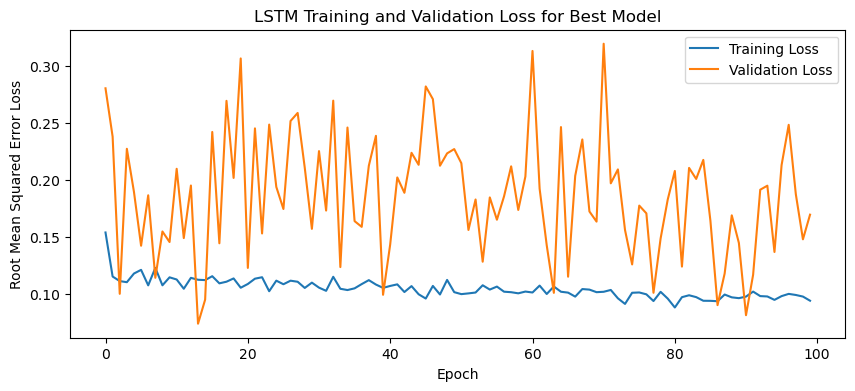

1/1 - 3s - loss: 0.0710 - 3s/epoch - 3s/step
Test Loss: 0.07102162390947342
1/1 [==============================] - 0s 56ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

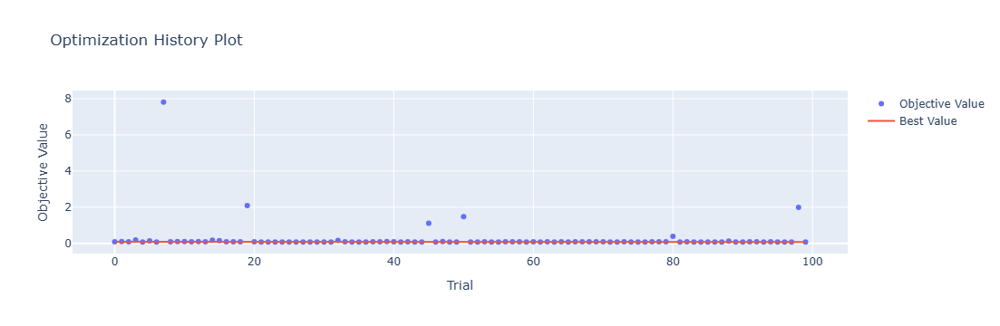

In [4]:
optuna.visualization.plot_optimization_history(study)

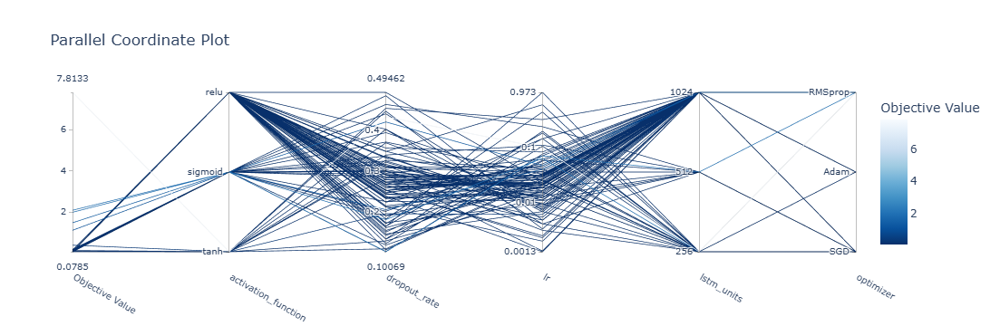

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

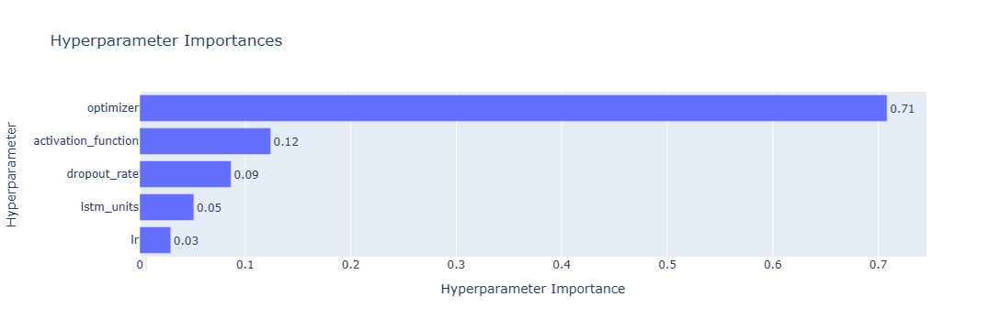

In [6]:
optuna.visualization.plot_param_importances(study)

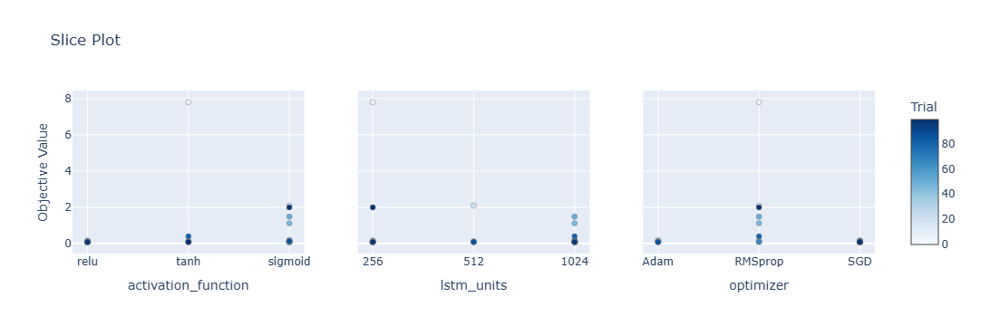

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

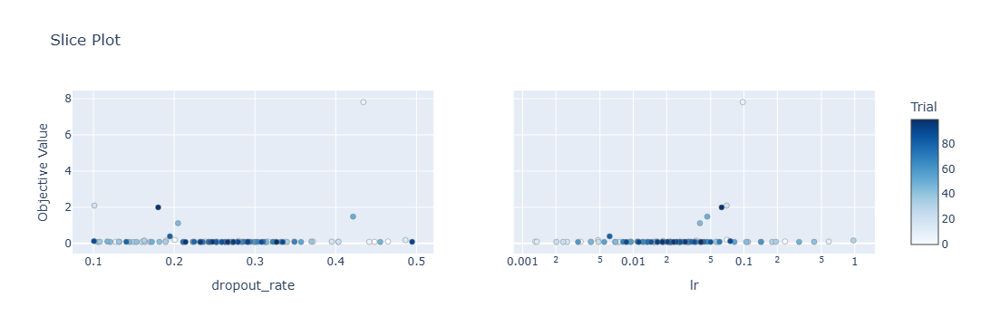

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 10s 58ms/step - loss: 0.1689 - accuracy: 0.7976 - mae: 0.1502 - rmse: 0.1689 - mape: 27.8547 - pearson: 0.7501 - val_loss: 0.2555 - val_accuracy: 0.0000e+00 - val_mae: 0.1813 - val_rmse: 0.2555 - val_mape: 39.5343 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 3s 41ms/step - loss: 0.1144 - accuracy: 0.8452 - mae: 0.0982 - rmse: 0.1144 - mape: 18.2170 - pearson: 0.7999 - val_loss: 0.2915 - val_accuracy: 0.0000e+00 - val_mae: 0.2271 - val_rmse: 0.2915 - val_mape: 49.6986 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 5s 58ms/step - loss: 0.1158 - accuracy: 0.8571 - mae: 0.1010 - rmse: 0.1158 - mape: 18.4890 - pearson: 0.7948 - val_loss: 0.2612 - val_accuracy: 0.0000e+00 - val_mae: 0.1903 - val_rmse: 0.2612 - val_mape: 41.7797 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 5s 62ms/step - loss: 0.1200 - accuracy: 0.8690 - mae: 0.1047 - rmse: 0.1200 - mape: 19.5921

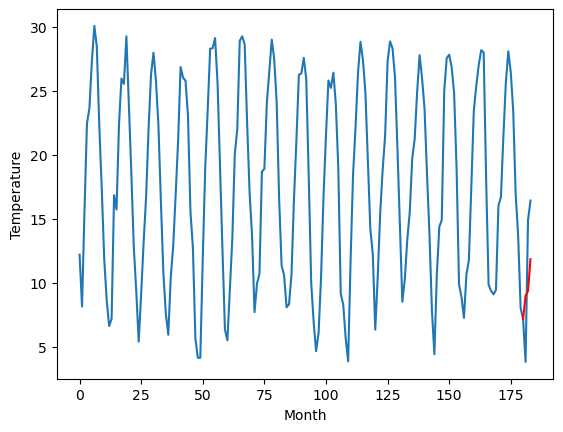

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.01		-0.52
8.44		8.39		-0.05
13.50		10.86		-2.64
[180, 181, 182, 183]
[13.23, 8.010941873192788, 8.387701074481011, 10.857917348742486]


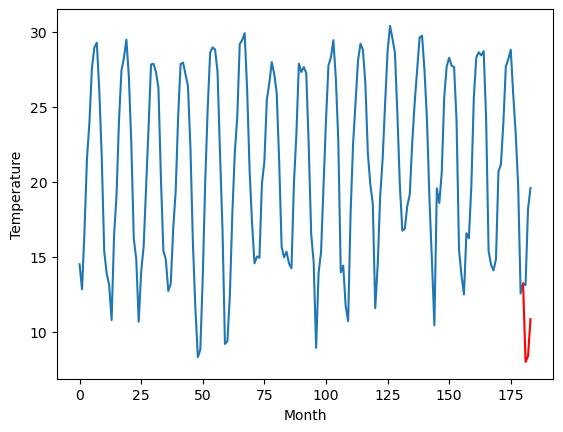

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		6.62		-0.69
8.17		7.00		-1.17
14.15		9.47		-4.68
[180, 181, 182, 183]
[7.18, 6.620977898836136, 7.00122784614563, 9.467627515792847]


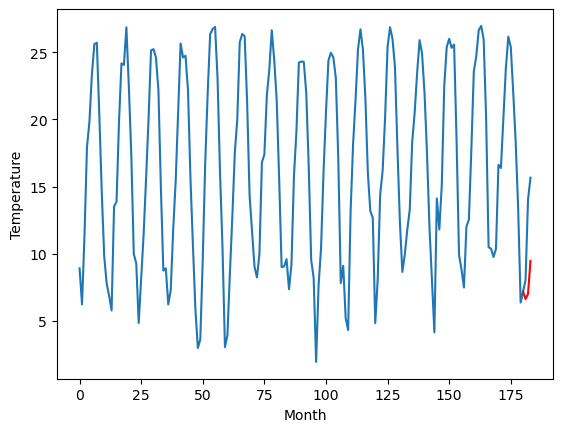

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		5.42		0.04
3.81		5.80		1.99
11.72		8.26		-3.46
[180, 181, 182, 183]
[11.46, 5.424176254272461, 5.800340929031372, 8.264796056747436]


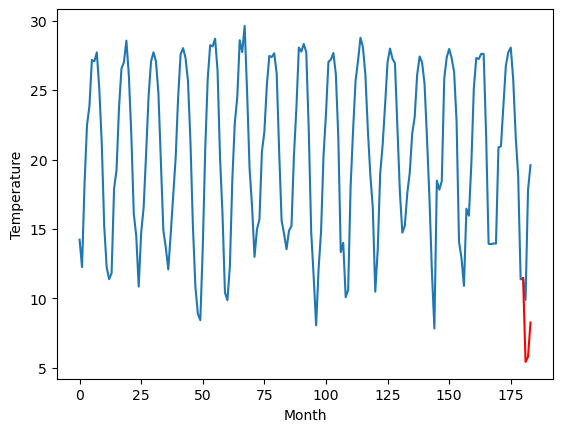

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		12.35		1.02
8.24		12.72		4.48
18.14		15.19		-2.95
[180, 181, 182, 183]
[9.27, 12.35108118414879, 12.7245360827446, 15.194938561916352]


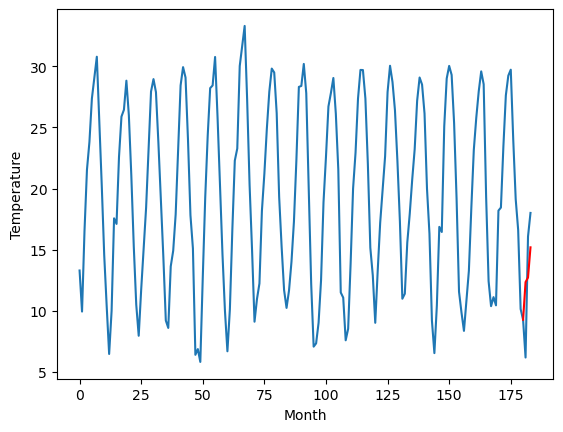

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		14.65		1.91
13.39		15.04		1.65
18.29		17.51		-0.78
[180, 181, 182, 183]
[7.77, 14.651246715784072, 15.042712498903274, 17.505774546861648]


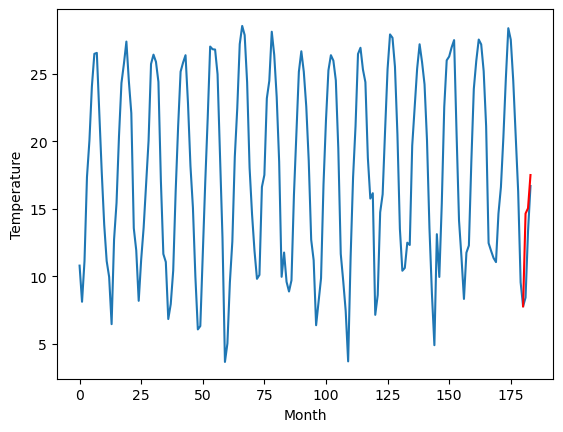

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		9.04		0.71
8.97		9.43		0.46
15.95		11.89		-4.06
[180, 181, 182, 183]
[6.59, 9.039853561520577, 9.429213929772377, 11.89215438425541]


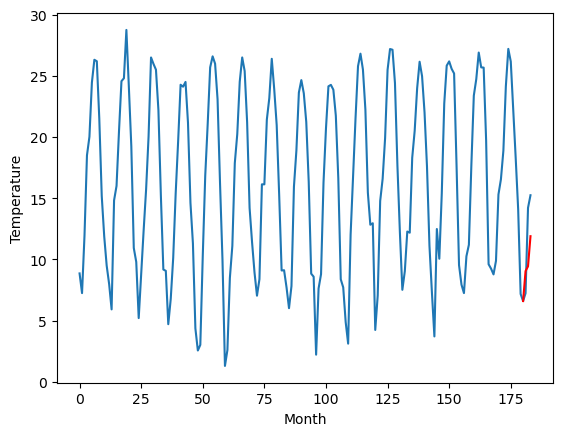

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		14.36		1.07
13.91		14.75		0.84
20.43		17.21		-3.22
[180, 181, 182, 183]
[5.3, 14.359211932420731, 14.752718399763108, 17.2139183986187]


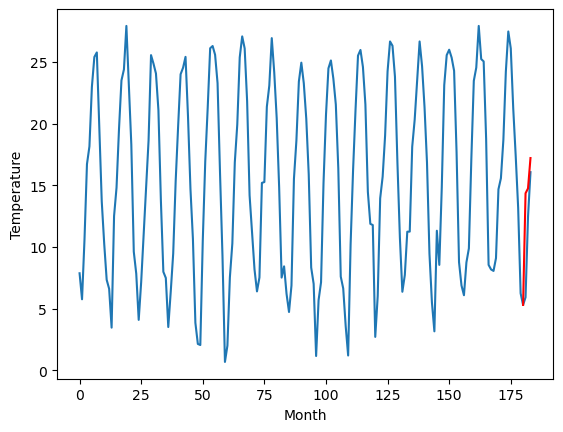

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		13.43		0.92
8.24		13.81		5.57
20.71		16.29		-4.42
[180, 181, 182, 183]
[3.1, 13.434176254272462, 13.813788491487504, 16.291608172655106]


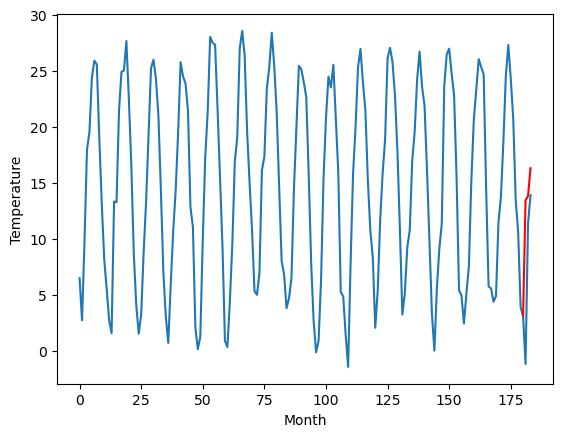

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		10.91		1.71
7.03		11.29		4.26
17.78		13.78		-4.00
[180, 181, 182, 183]
[0.6, 10.914989300966262, 11.292023220062255, 13.776459255218505]


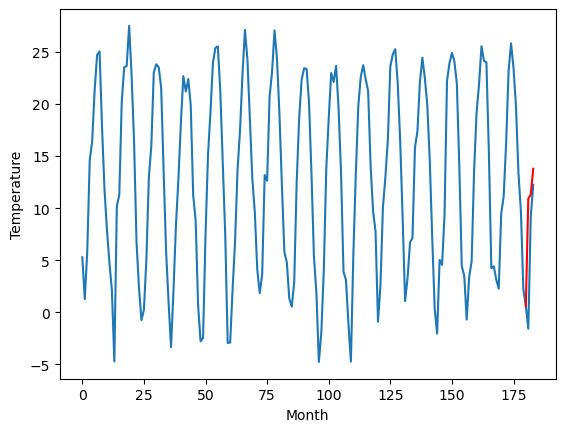

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		8.97		1.73
2.93		9.34		6.41
14.66		11.84		-2.82
[180, 181, 182, 183]
[-0.75, 8.96820013821125, 9.344592413306236, 11.838266453146934]


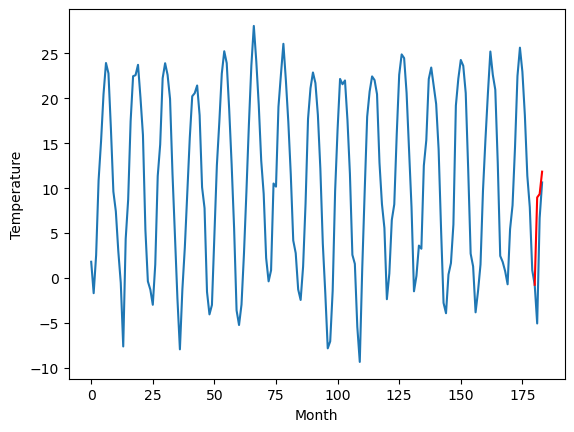

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[9.00348219871521, 8.010941873192788, 6.620977898836136, 5.424176254272461, 12.35108118414879, 14.651246715784072, 9.039853561520577, 14.359211932420731, 13.434176254272462, 10.914989300966262, 8.96820013821125]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   9.003482
1                 1    8.53   8.010942
2                 2    7.31   6.620978
3                 3    5.38   5.424176
4                 4   11.33  12.351081
5                 5   12.74  14.651247
6                 6    8.33   9.039854
7                 7   13.29  14.359212
8                 8   12.51  13.434176
9                 9    9.20  10.914989
10               10    7.24   8.968200


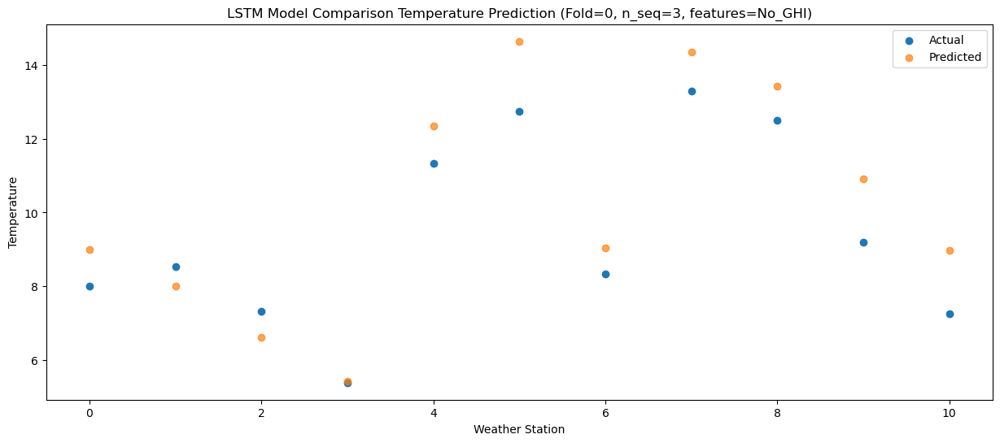

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   9.376908
1                 1    8.44   8.387701
2                 2    8.17   7.001228
3                 3    3.81   5.800341
4                 4    8.24  12.724536
5                 5   13.39  15.042712
6                 6    8.97   9.429214
7                 7   13.91  14.752718
8                 8    8.24  13.813788
9                 9    7.03  11.292023
10               10    2.93   9.344592


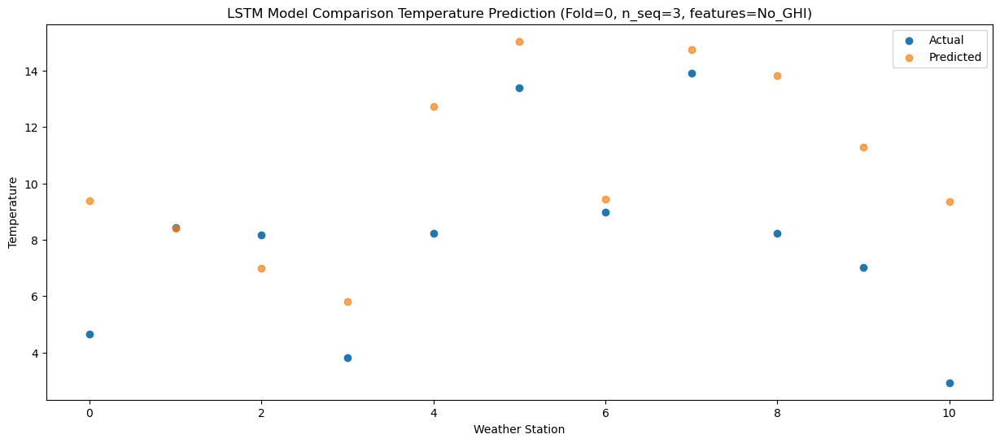

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  11.859947
1                 1   13.50  10.857917
2                 2   14.15   9.467628
3                 3   11.72   8.264796
4                 4   18.14  15.194939
5                 5   18.29  17.505775
6                 6   15.95  11.892154
7                 7   20.43  17.213918
8                 8   20.71  16.291608
9                 9   17.78  13.776459
10               10   14.66  11.838266


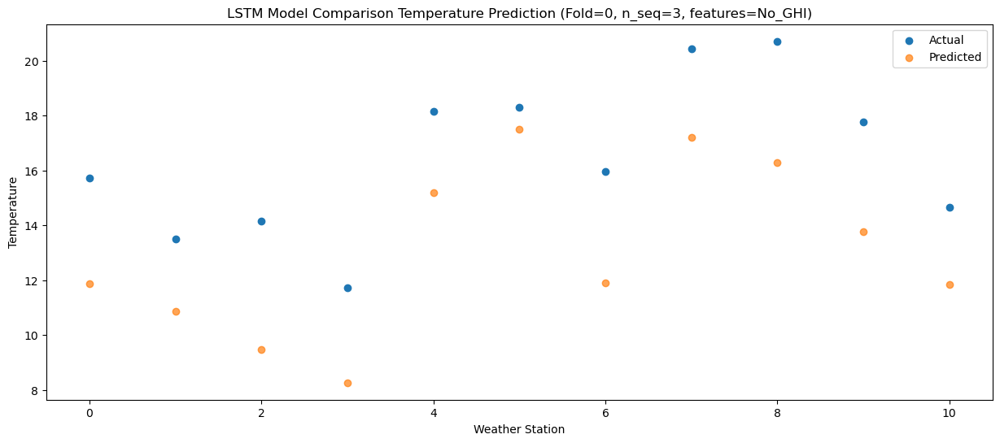

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (1, 1, 1024)              12263424  
                                                                 
 dropout_8 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_9 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_9 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_12 (Dense)            (1, 256)                  262400    
                                                                 
 dense_13 (Dense)            (1, 128)                  32896     
                                                                 
 dense_14 (Dense)            (1, 3)                   

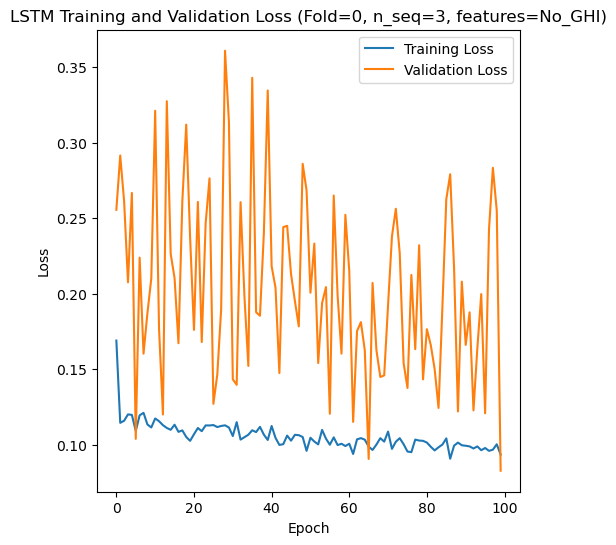

Epoch 1/100
84/84 [==============================] - 9s 57ms/step - loss: 0.1450 - accuracy: 0.8095 - mae: 0.1242 - rmse: 0.1450 - mape: 23.2908 - pearson: 0.7285 - val_loss: 0.1334 - val_accuracy: 0.0000e+00 - val_mae: 0.0950 - val_rmse: 0.1334 - val_mape: 20.4483 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 3s 39ms/step - loss: 0.1110 - accuracy: 0.8690 - mae: 0.0959 - rmse: 0.1110 - mape: 17.8071 - pearson: 0.7853 - val_loss: 0.2215 - val_accuracy: 0.0000e+00 - val_mae: 0.1769 - val_rmse: 0.2215 - val_mape: 37.5769 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 3s 39ms/step - loss: 0.1114 - accuracy: 0.8333 - mae: 0.0967 - rmse: 0.1114 - mape: 18.1444 - pearson: 0.7821 - val_loss: 0.2184 - val_accuracy: 0.0000e+00 - val_mae: 0.1556 - val_rmse: 0.2184 - val_mape: 33.1905 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 7s 81ms/step - loss: 0.1110 - accuracy: 0.9048 - mae: 0.0961 - rmse: 0.1110 - mape: 17.4831 

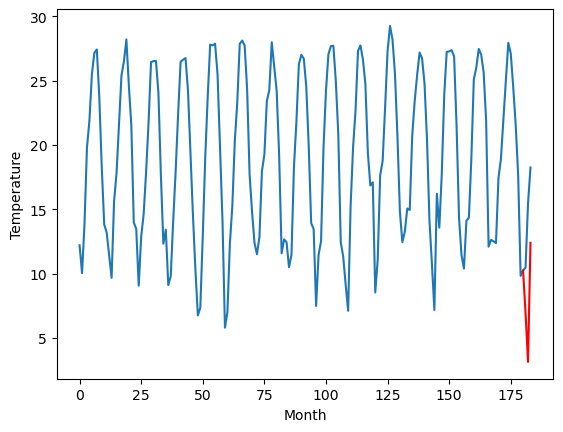

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.49		5.50		-1.99
8.15		1.69		-6.46
14.92		10.96		-3.96
[180, 181, 182, 183]
[6.41, 5.504284086227417, 1.6887685680389408, 10.95912569999695]


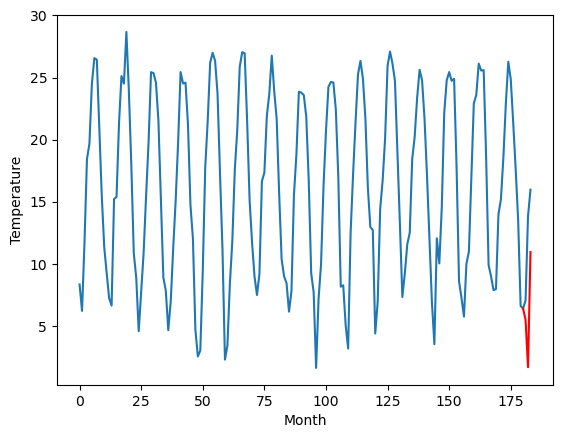

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.35		6.74		-2.61
9.84		2.93		-6.91
16.90		12.20		-4.70
[180, 181, 182, 183]
[7.6, 6.7441334056854245, 2.926975183486938, 12.199627809524536]


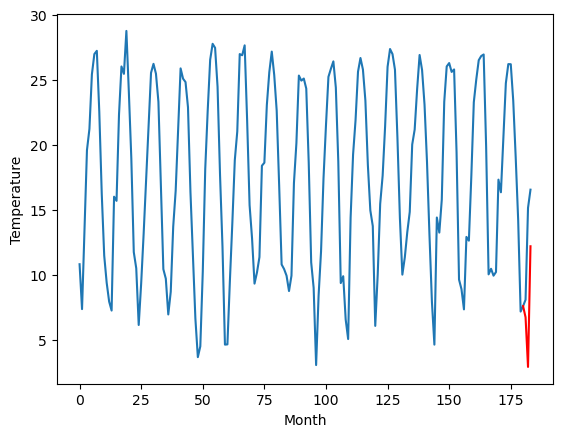

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.86		5.79		-2.07
6.27		1.97		-4.30
13.64		11.24		-2.40
[180, 181, 182, 183]
[11.89, 5.785041770935059, 1.967451057434082, 11.24094482421875]


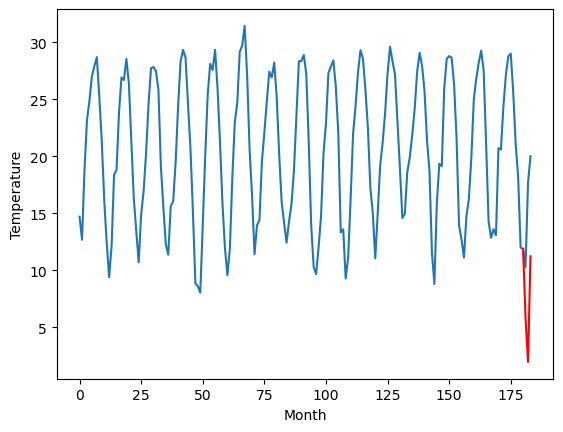

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.19		10.03		-2.16
10.49		6.21		-4.28
18.10		15.48		-2.62
[180, 181, 182, 183]
[10.96, 10.031181287765502, 6.208544921874999, 15.484709930419921]


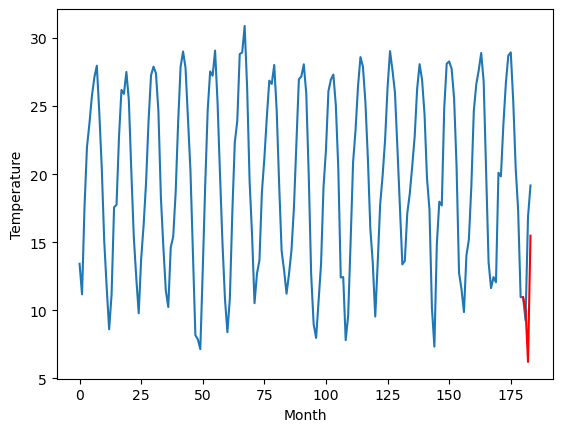

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.84		6.18		-0.66
7.22		2.36		-4.86
14.56		11.63		-2.93
[180, 181, 182, 183]
[7.75, 6.179162836074829, 2.363529062271118, 11.632138109207153]


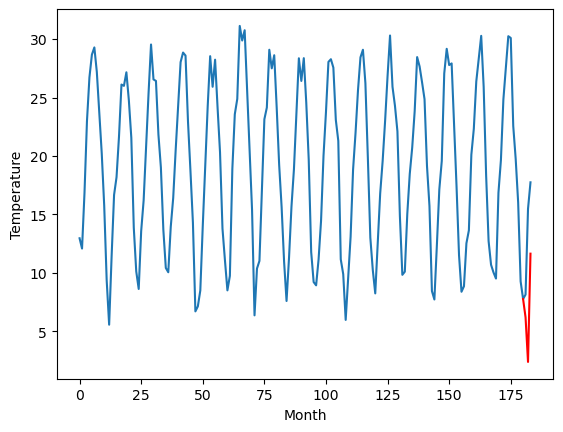

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.62		8.64		-1.98
11.40		4.82		-6.58
17.68		14.09		-3.59
[180, 181, 182, 183]
[6.17, 8.641653604507447, 4.822260684967041, 14.090592212677002]


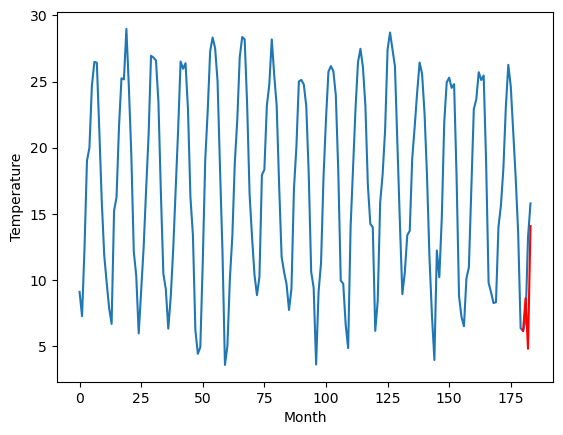

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.40		12.53		-1.87
11.40		8.70		-2.70
22.72		17.98		-4.74
[180, 181, 182, 183]
[4.57, 12.529571495056153, 8.697774372100831, 17.979647121429444]


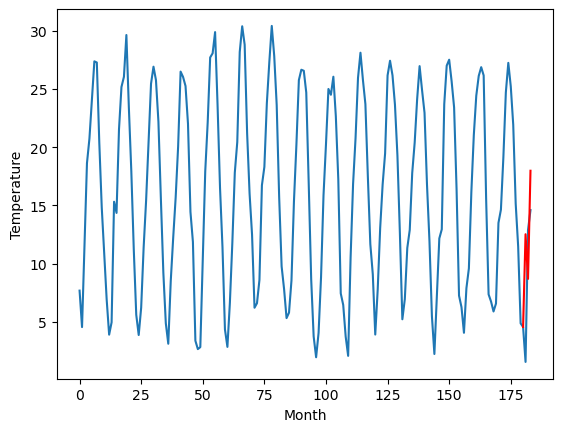

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		11.24		-1.83
8.29		7.40		-0.89
20.85		16.69		-4.16
[180, 181, 182, 183]
[5.46, 11.235043449401855, 7.401424331665039, 16.68917362213135]


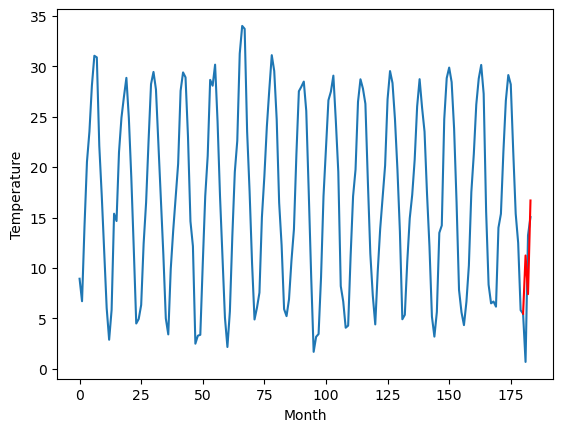

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.06		10.77		-2.29
8.69		6.94		-1.75
19.40		16.22		-3.18
[180, 181, 182, 183]
[5.42, 10.766706657409667, 6.94019980430603, 16.22264952659607]


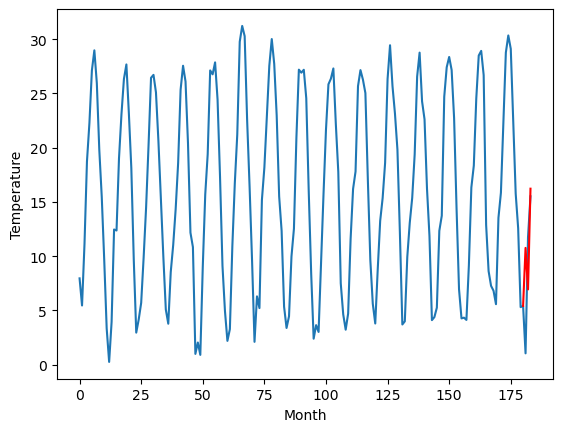

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.28		6.92		-0.36
6.32		3.09		-3.23
13.54		12.36		-1.18
[180, 181, 182, 183]
[2.17, 6.917936916351318, 3.0866211605072014, 12.355520124435424]


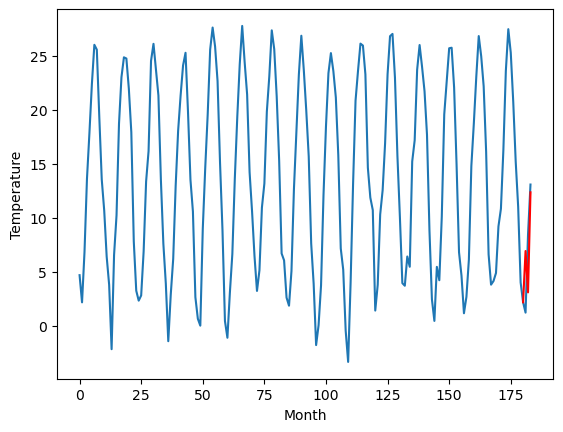

RangeIndex(start=1, stop=12, step=1)
[9.54, 7.489999999999999, 9.35, 7.859999999999999, 12.189999999999998, 6.84, 10.62, 14.4, 13.07, 13.06, 7.279999999999999]
[6.94003903388977, 5.504284086227417, 6.7441334056854245, 5.785041770935059, 10.031181287765502, 6.179162836074829, 8.641653604507447, 12.529571495056153, 11.235043449401855, 10.766706657409667, 6.917936916351318]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.54   6.940039
1                 1    7.49   5.504284
2                 2    9.35   6.744133
3                 3    7.86   5.785042
4                 4   12.19  10.031181
5                 5    6.84   6.179163
6                 6   10.62   8.641654
7                 7   14.40  12.529571
8                 8   13.07  11.235043
9                 9   13.06  10.766707
10               10    7.28   6.917937


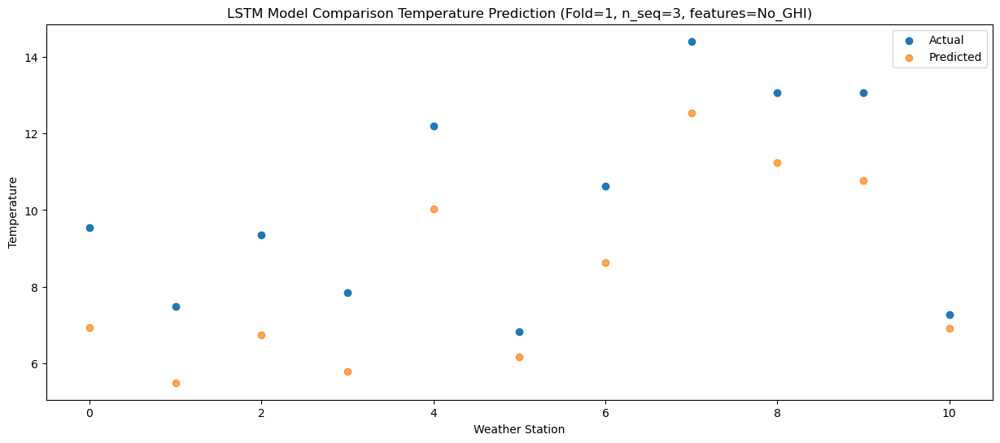

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.76   3.126128
1                 1    8.15   1.688769
2                 2    9.84   2.926975
3                 3    6.27   1.967451
4                 4   10.49   6.208545
5                 5    7.22   2.363529
6                 6   11.40   4.822261
7                 7   11.40   8.697774
8                 8    8.29   7.401424
9                 9    8.69   6.940200
10               10    6.32   3.086621


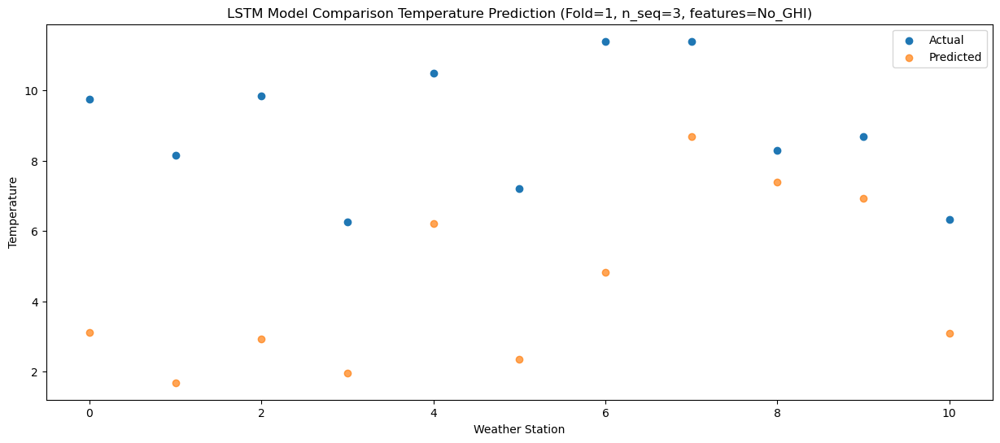

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.74  12.390382
1                 1   14.92  10.959126
2                 2   16.90  12.199628
3                 3   13.64  11.240945
4                 4   18.10  15.484710
5                 5   14.56  11.632138
6                 6   17.68  14.090592
7                 7   22.72  17.979647
8                 8   20.85  16.689174
9                 9   19.40  16.222650
10               10   13.54  12.355520


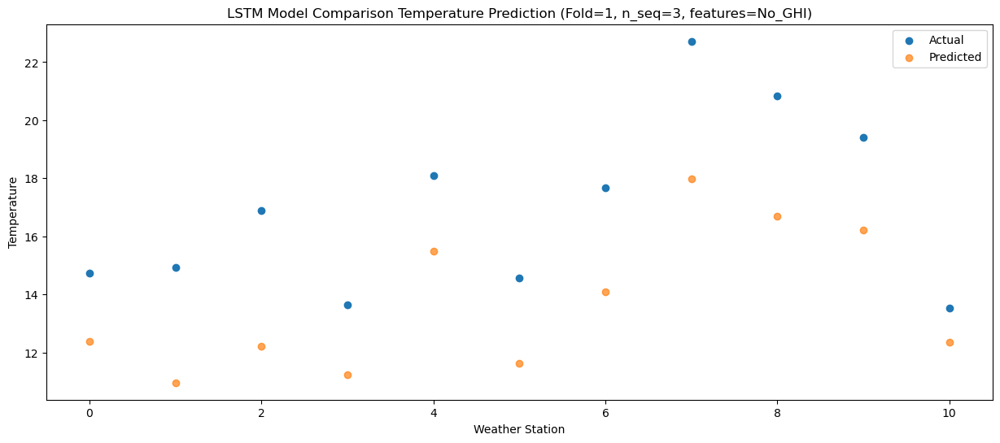

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_10 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_11 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_11 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_15 (Dense)            (1, 256)                  262400    
                                                                 
 dense_16 (Dense)            (1, 128)                  32896     
                                                                 
 dense_17 (Dense)            (1, 3)                   

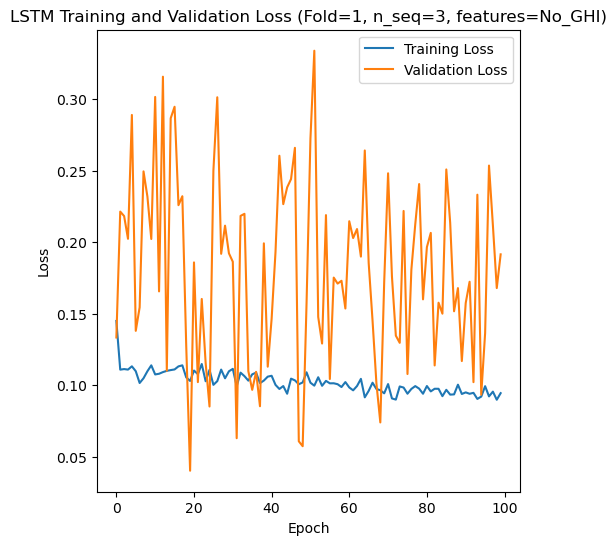

Epoch 1/100
84/84 [==============================] - 9s 55ms/step - loss: 0.1813 - accuracy: 0.7857 - mae: 0.1609 - rmse: 0.1813 - mape: 30.6281 - pearson: 0.7021 - val_loss: 0.2192 - val_accuracy: 0.0000e+00 - val_mae: 0.1477 - val_rmse: 0.2192 - val_mape: 33.0963 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 3s 41ms/step - loss: 0.1114 - accuracy: 0.8810 - mae: 0.0969 - rmse: 0.1114 - mape: 18.1780 - pearson: 0.8466 - val_loss: 0.1009 - val_accuracy: 0.0000e+00 - val_mae: 0.0803 - val_rmse: 0.1009 - val_mape: 18.0249 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 5s 66ms/step - loss: 0.1156 - accuracy: 0.8810 - mae: 0.1001 - rmse: 0.1156 - mape: 18.4566 - pearson: 0.8243 - val_loss: 0.2339 - val_accuracy: 0.0000e+00 - val_mae: 0.1617 - val_rmse: 0.2339 - val_mape: 36.2601 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 4s 42ms/step - loss: 0.1140 - accuracy: 0.8929 - mae: 0.0992 - rmse: 0.1140 - mape: 18.7334 

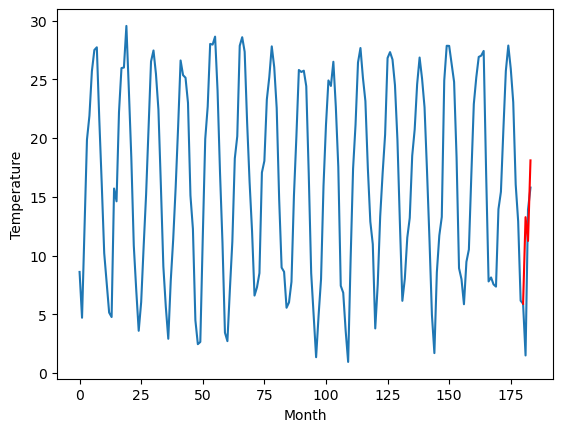

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		7.90		1.21
2.65		5.89		3.24
12.84		12.75		-0.09
[180, 181, 182, 183]
[2.63, 7.901700038909912, 5.8853609752655025, 12.749937314987182]


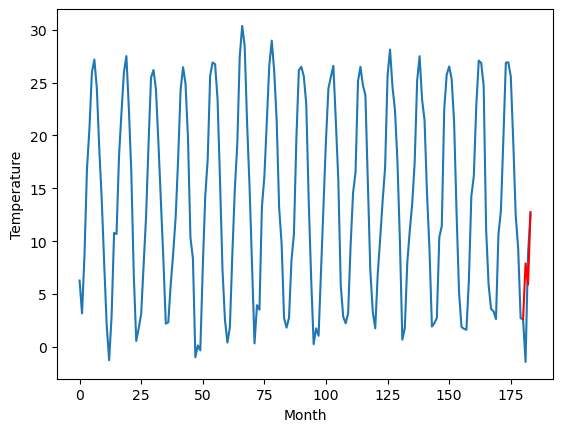

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		13.17		0.47
15.43		11.16		-4.27
17.24		18.00		0.76
[180, 181, 182, 183]
[16.55, 13.174468674659728, 11.160922684669494, 18.002433457374572]


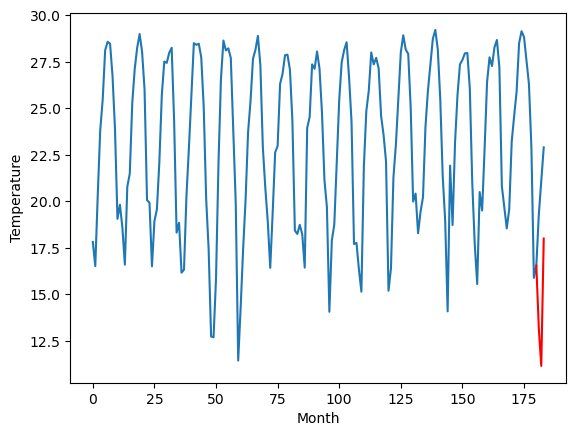

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		9.70		4.21
5.51		7.68		2.17
9.62		14.52		4.90
[180, 181, 182, 183]
[-0.83, 9.699920363426209, 7.683059401512146, 14.524801917076111]


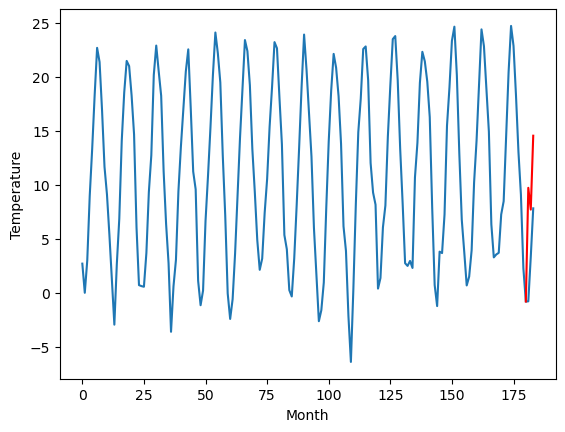

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		9.74		0.78
8.22		7.73		-0.49
15.55		14.57		-0.98
[180, 181, 182, 183]
[11.52, 9.739106044769287, 7.727467403411865, 14.565405235290527]


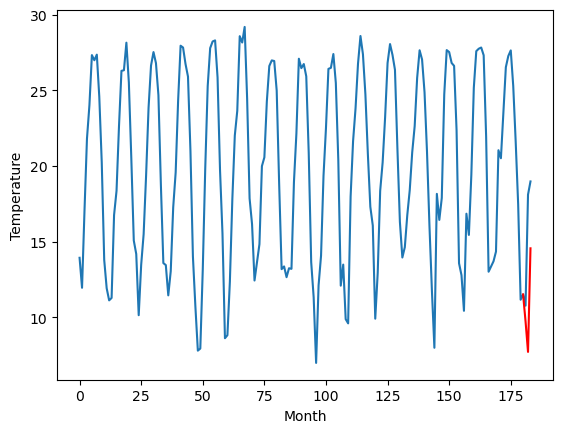

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		7.41		1.72
3.34		5.40		2.06
11.72		12.25		0.53
[180, 181, 182, 183]
[11.47, 7.412441759109497, 5.404591112136841, 12.245933084487916]


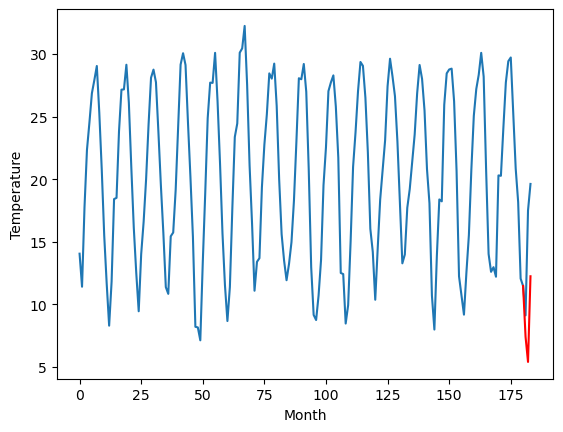

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		18.95		1.83
14.01		16.95		2.94
24.38		23.79		-0.59
[180, 181, 182, 183]
[7.75, 18.95355827331543, 16.94608814239502, 23.79434902191162]


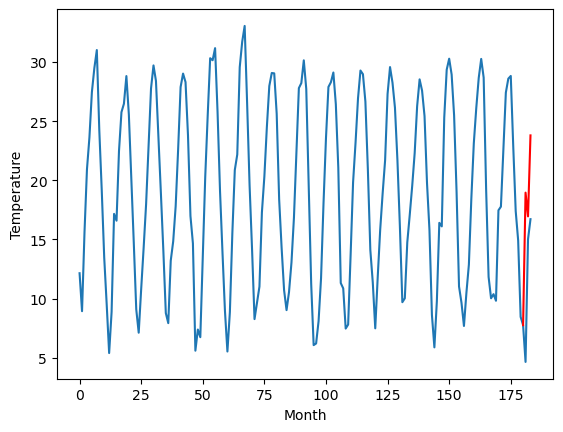

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		3.81		0.59
6.14		1.82		-4.32
9.24		8.67		-0.57
[180, 181, 182, 183]
[4.9, 3.814478569030762, 1.8165957260131838, 8.668779067993164]


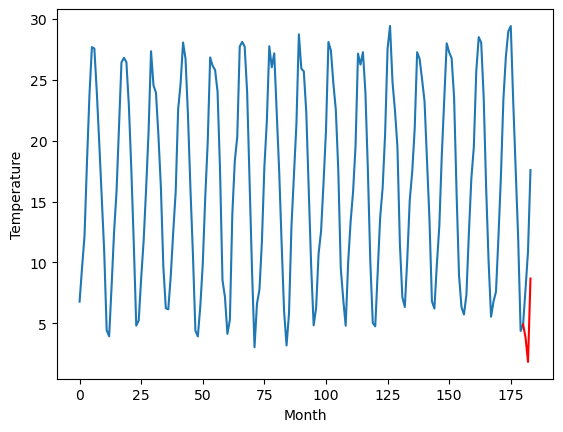

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		15.09		1.21
12.96		13.09		0.13
12.56		19.93		7.37
[180, 181, 182, 183]
[14.14, 15.085254850387573, 13.085358800888061, 19.930425348281858]


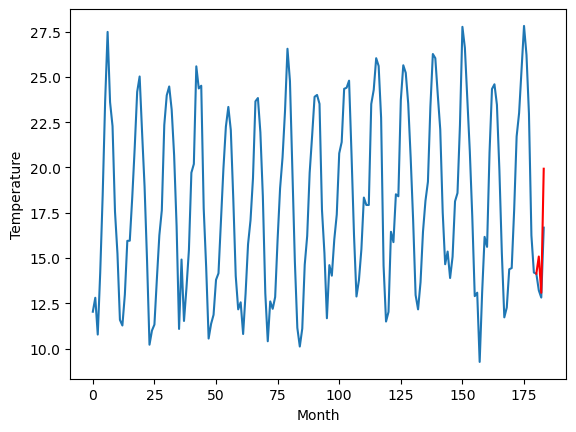

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		15.19		1.55
14.14		13.19		-0.95
21.02		20.03		-0.99
[180, 181, 182, 183]
[5.55, 15.193751859664918, 13.192417669296265, 20.03246455192566]


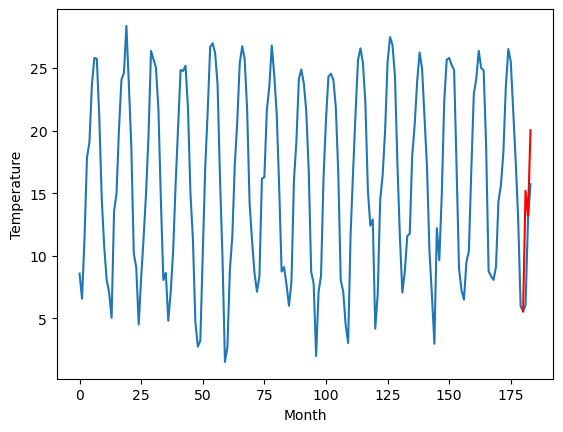

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		13.28		0.81
13.82		11.27		-2.55
20.03		18.11		-1.92
[180, 181, 182, 183]
[3.19, 13.28475452899933, 11.274488463401795, 18.112118258476258]


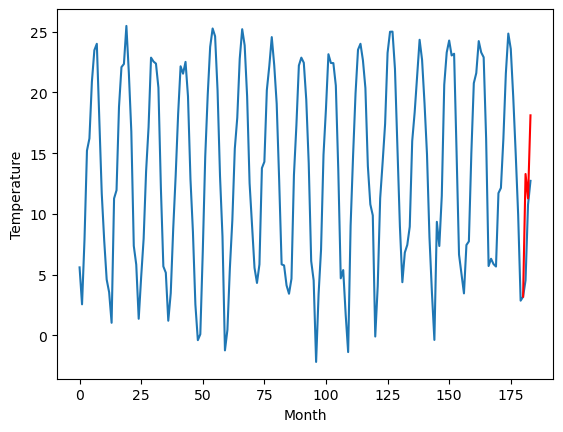

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[13.270548238754273, 7.901700038909912, 13.174468674659728, 9.699920363426209, 9.739106044769287, 7.412441759109497, 18.95355827331543, 3.814478569030762, 15.085254850387573, 15.193751859664918, 13.28475452899933]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  13.270548
1                 1    6.69   7.901700
2                 2   12.70  13.174469
3                 3    5.49   9.699920
4                 4    8.96   9.739106
5                 5    5.69   7.412442
6                 6   17.12  18.953558
7                 7    3.22   3.814479
8                 8   13.88  15.085255
9                 9   13.64  15.193752
10               10   12.47  13.284755


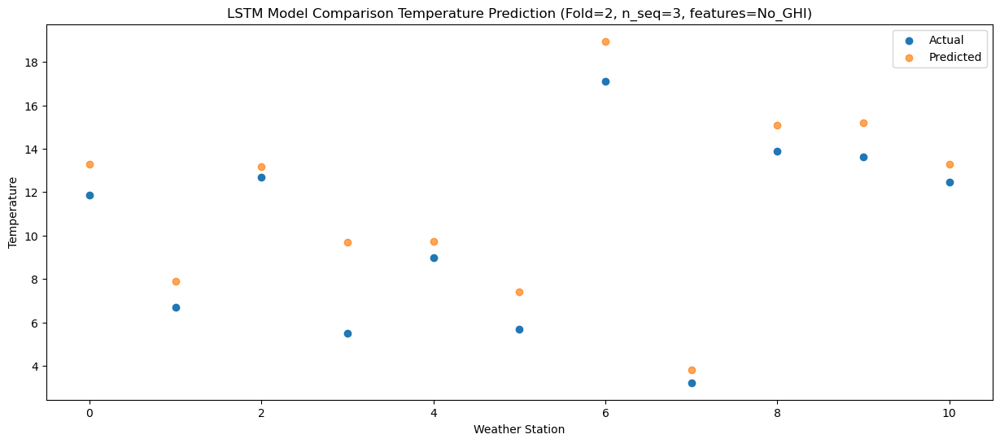

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48  11.248121
1                 1    2.65   5.885361
2                 2   15.43  11.160923
3                 3    5.51   7.683059
4                 4    8.22   7.727467
5                 5    3.34   5.404591
6                 6   14.01  16.946088
7                 7    6.14   1.816596
8                 8   12.96  13.085359
9                 9   14.14  13.192418
10               10   13.82  11.274488


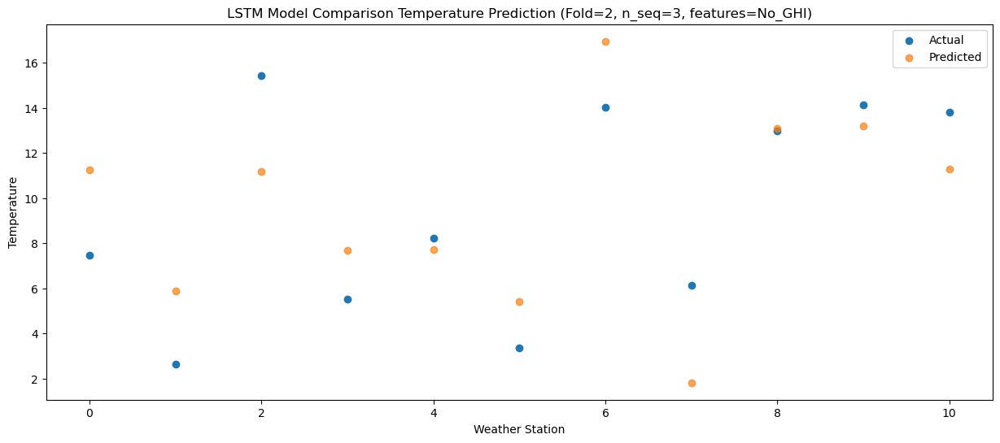

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90  18.104256
1                 1   12.84  12.749937
2                 2   17.24  18.002433
3                 3    9.62  14.524802
4                 4   15.55  14.565405
5                 5   11.72  12.245933
6                 6   24.38  23.794349
7                 7    9.24   8.668779
8                 8   12.56  19.930425
9                 9   21.02  20.032465
10               10   20.03  18.112118


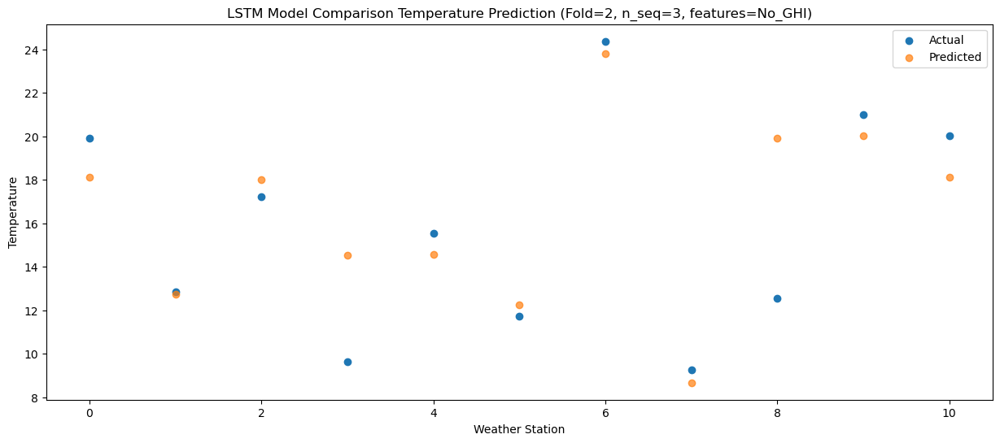

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_12 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_13 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_13 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_18 (Dense)            (1, 256)                  262400    
                                                                 
 dense_19 (Dense)            (1, 128)                  32896     
                                                                 
 dense_20 (Dense)            (1, 3)                   

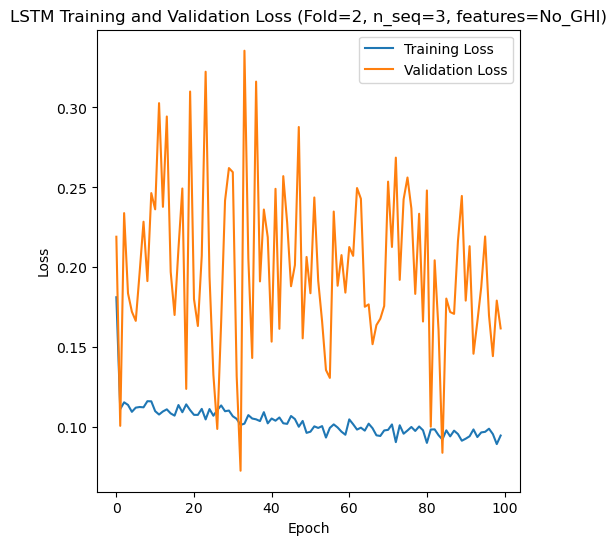

Epoch 1/100
84/84 [==============================] - 9s 52ms/step - loss: 0.1608 - accuracy: 0.7976 - mae: 0.1429 - rmse: 0.1608 - mape: 27.9688 - pearson: 0.7839 - val_loss: 0.0520 - val_accuracy: 0.0000e+00 - val_mae: 0.0514 - val_rmse: 0.0520 - val_mape: 11.3441 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 3s 38ms/step - loss: 0.1113 - accuracy: 0.9167 - mae: 0.0980 - rmse: 0.1113 - mape: 18.5944 - pearson: 0.8534 - val_loss: 0.0930 - val_accuracy: 0.0000e+00 - val_mae: 0.0895 - val_rmse: 0.0930 - val_mape: 20.5326 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 3s 39ms/step - loss: 0.1087 - accuracy: 0.9286 - mae: 0.0955 - rmse: 0.1087 - mape: 18.4343 - pearson: 0.8454 - val_loss: 0.2151 - val_accuracy: 0.0000e+00 - val_mae: 0.1710 - val_rmse: 0.2151 - val_mape: 37.5649 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 5s 66ms/step - loss: 0.1159 - accuracy: 0.8929 - mae: 0.1000 - rmse: 0.1159 - mape: 19.3621 

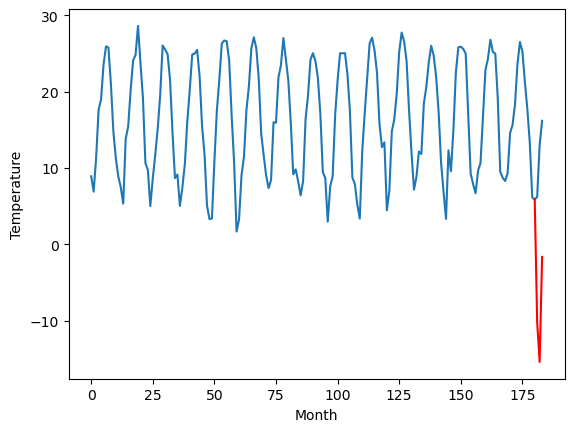

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		7.58		-0.84
4.70		2.37		-2.33
16.67		16.15		-0.52
[180, 181, 182, 183]
[3.2, 7.580927677154541, 2.3692043495178225, 16.14617235183716]


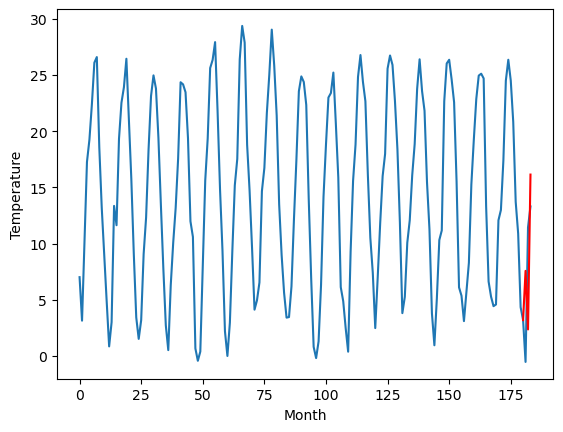

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		7.06		-3.24
12.60		1.85		-10.75
13.75		15.61		1.86
[180, 181, 182, 183]
[8.48, 7.055757679939269, 1.8476621294021598, 15.610816159248351]


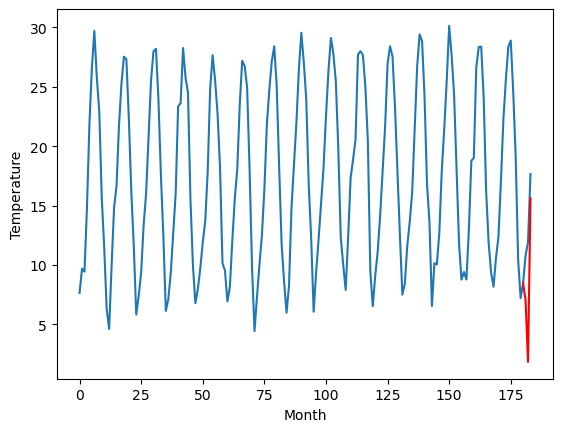

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		1.21		-0.53
0.42		-4.00		-4.42
10.63		9.77		-0.86
[180, 181, 182, 183]
[1.55, 1.208850932121277, -3.9975432634353636, 9.772542071342468]


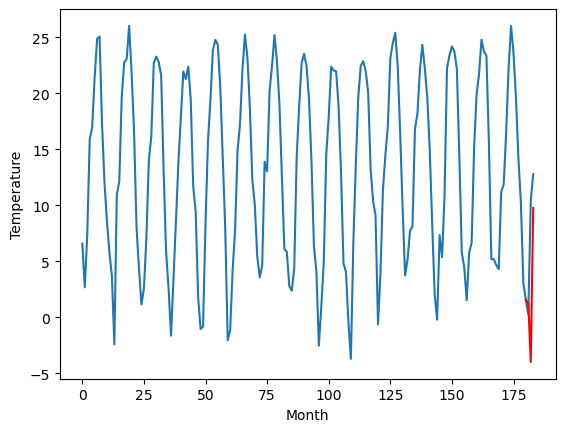

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		6.91		-0.52
3.56		1.70		-1.86
16.64		15.48		-1.16
[180, 181, 182, 183]
[1.08, 6.909682178497315, 1.6984833717346195, 15.482863330841065]


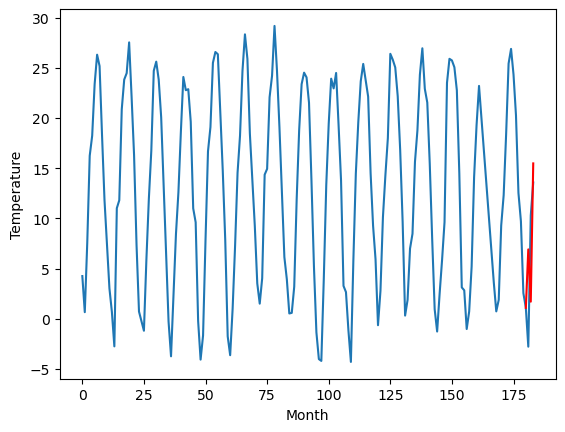

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		5.03		-0.54
2.85		-0.18		-3.03
14.18		13.60		-0.58
[180, 181, 182, 183]
[0.21, 5.028148908615112, -0.18256495475769086, 13.602815408706665]


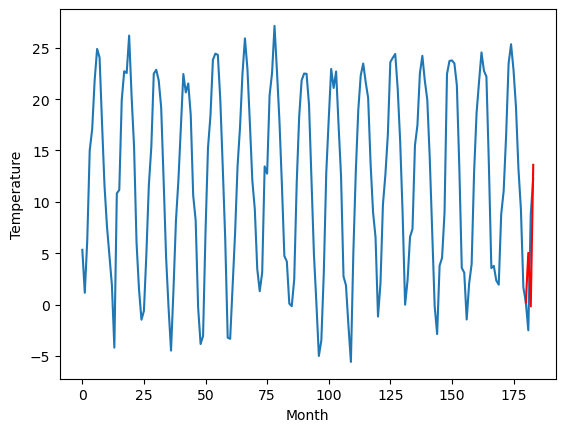

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		5.66		-2.26
8.02		0.46		-7.56
10.99		14.24		3.25
[180, 181, 182, 183]
[-8.22, 5.662319326400757, 0.45512881278991735, 14.235334539413453]


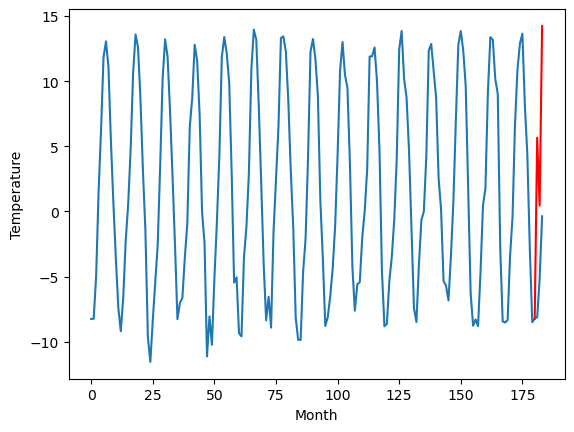

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		4.59		-2.53
9.97		-0.62		-10.59
11.57		13.16		1.59
[180, 181, 182, 183]
[10.04, 4.590060181617737, -0.6160545873641965, 13.159037537574768]


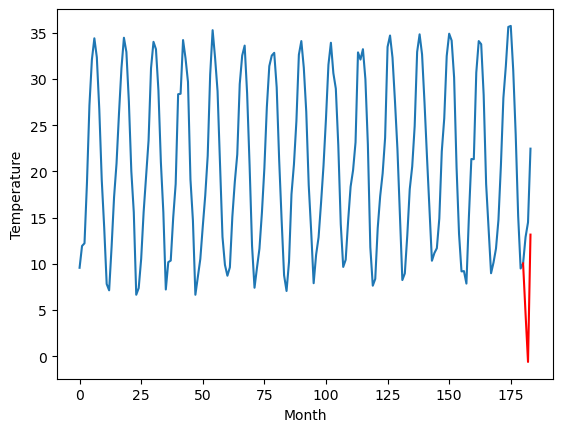

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		2.26		-3.21
6.40		-2.94		-9.34
6.18		10.82		4.64
[180, 181, 182, 183]
[9.17, 2.2603341341018677, -2.9413856267929077, 10.821797013282776]


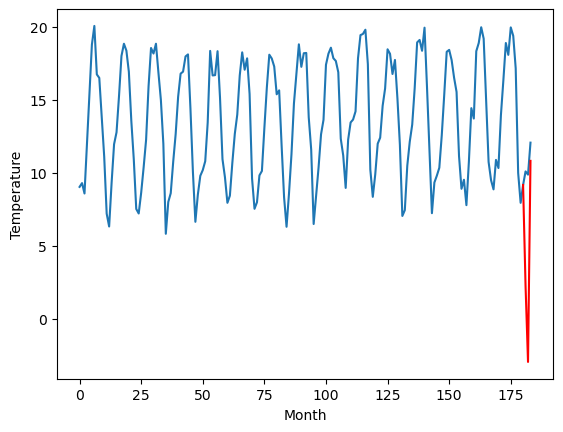

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		3.33		1.02
2.19		-1.87		-4.06
7.19		11.89		4.70
[180, 181, 182, 183]
[0.94, 3.332511262893677, -1.8728439044952392, 11.890363531112671]


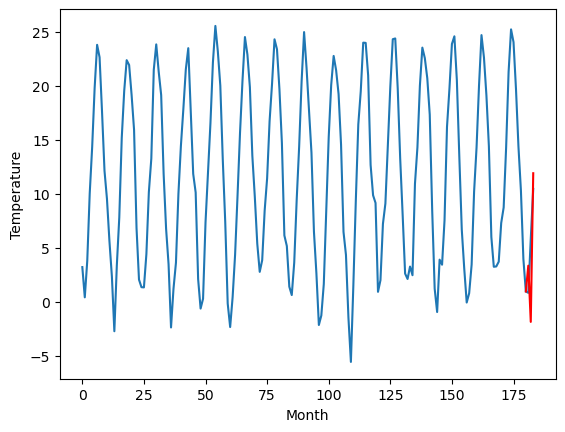

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-10.24		-0.44
-10.60		-15.44		-4.84
-3.41		-1.68		1.73
[180, 181, 182, 183]
[-0.13, -10.237253775596619, -15.444103827476502, -1.6802154684066775]


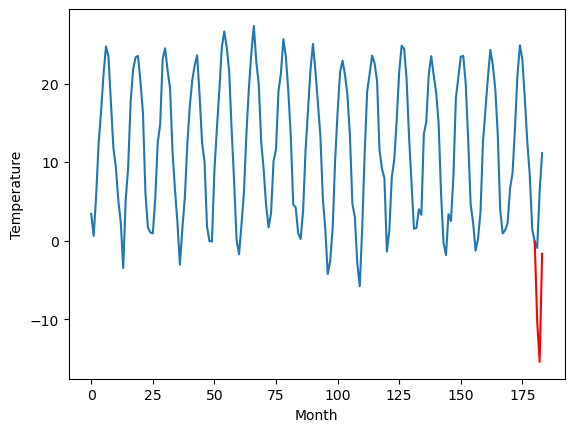

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-10.228594889640808, 7.580927677154541, 7.055757679939269, 1.208850932121277, 6.909682178497315, 5.028148908615112, 5.662319326400757, 4.590060181617737, 2.2603341341018677, 3.332511262893677, -10.237253775596619]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52 -10.228595
1                 1    8.42   7.580928
2                 2   10.30   7.055758
3                 3    1.74   1.208851
4                 4    7.43   6.909682
5                 5    5.57   5.028149
6                 6    7.92   5.662319
7                 7    7.12   4.590060
8                 8    5.47   2.260334
9                 9    2.31   3.332511
10               10   -9.80 -10.237254


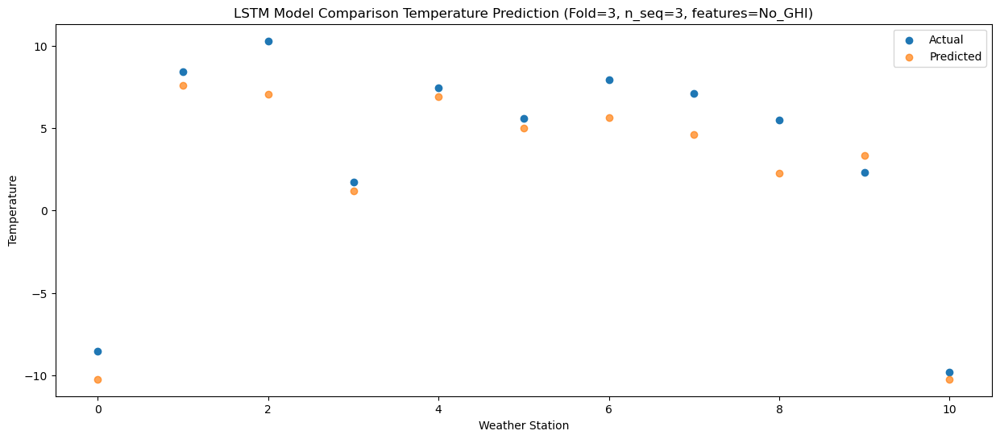

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15 -15.428980
1                 1    4.70   2.369204
2                 2   12.60   1.847662
3                 3    0.42  -3.997543
4                 4    3.56   1.698483
5                 5    2.85  -0.182565
6                 6    8.02   0.455129
7                 7    9.97  -0.616055
8                 8    6.40  -2.941386
9                 9    2.19  -1.872844
10               10  -10.60 -15.444104


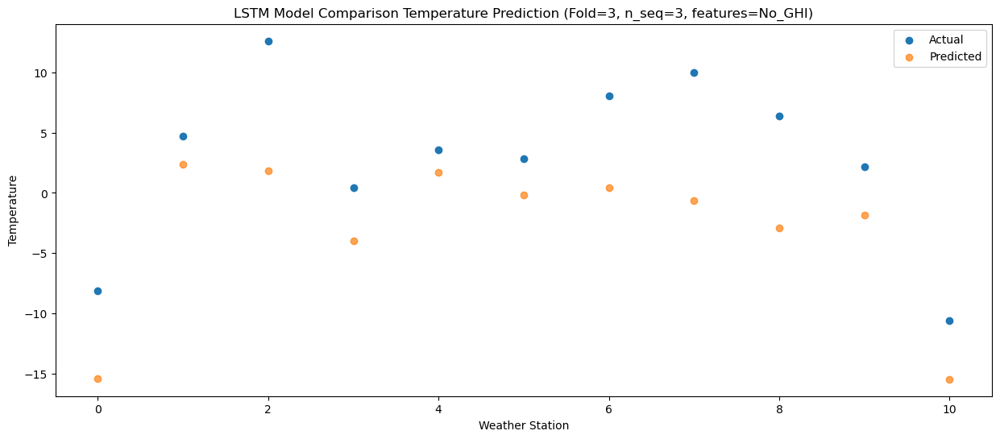

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -1.664177
1                 1   16.67  16.146172
2                 2   13.75  15.610816
3                 3   10.63   9.772542
4                 4   16.64  15.482863
5                 5   14.18  13.602815
6                 6   10.99  14.235335
7                 7   11.57  13.159038
8                 8    6.18  10.821797
9                 9    7.19  11.890364
10               10   -3.41  -1.680215


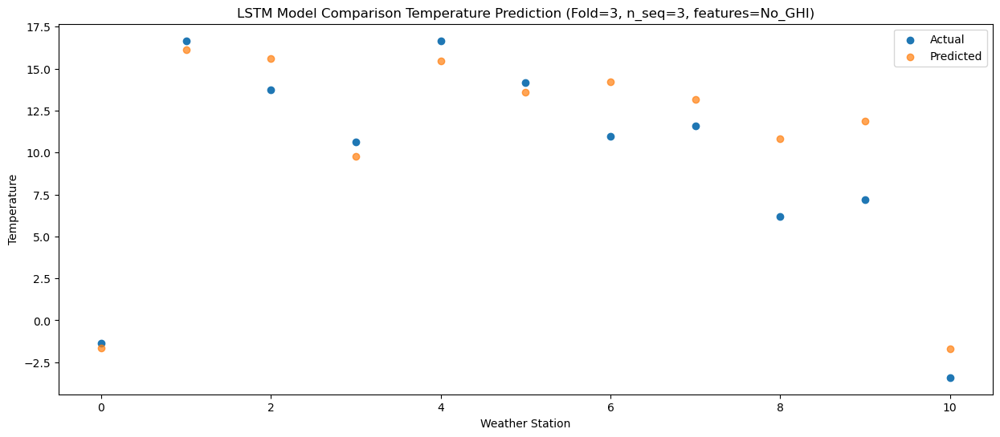

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_14 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_15 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_15 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_21 (Dense)            (1, 256)                  262400    
                                                                 
 dense_22 (Dense)            (1, 128)                  32896     
                                                                 
 dense_23 (Dense)            (1, 3)                   

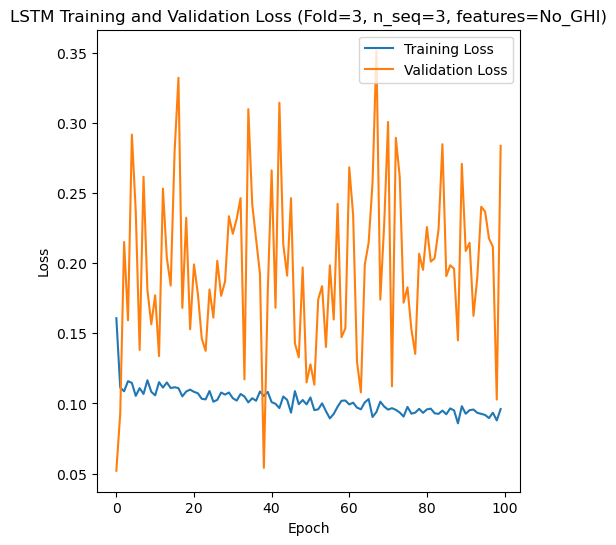

Epoch 1/100
84/84 [==============================] - 9s 54ms/step - loss: 0.1715 - accuracy: 0.7857 - mae: 0.1473 - rmse: 0.1715 - mape: 28.5577 - pearson: 0.6907 - val_loss: 0.2331 - val_accuracy: 0.0000e+00 - val_mae: 0.1709 - val_rmse: 0.2331 - val_mape: 37.1692 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 3s 39ms/step - loss: 0.1095 - accuracy: 0.8690 - mae: 0.0939 - rmse: 0.1095 - mape: 17.7420 - pearson: 0.8182 - val_loss: 0.2228 - val_accuracy: 0.0000e+00 - val_mae: 0.1689 - val_rmse: 0.2228 - val_mape: 36.9745 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 3s 39ms/step - loss: 0.1067 - accuracy: 0.8929 - mae: 0.0915 - rmse: 0.1067 - mape: 17.0300 - pearson: 0.8202 - val_loss: 0.2167 - val_accuracy: 0.0000e+00 - val_mae: 0.1592 - val_rmse: 0.2167 - val_mape: 34.9600 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 4s 44ms/step - loss: 0.1032 - accuracy: 0.8929 - mae: 0.0898 - rmse: 0.1032 - mape: 16.5524 

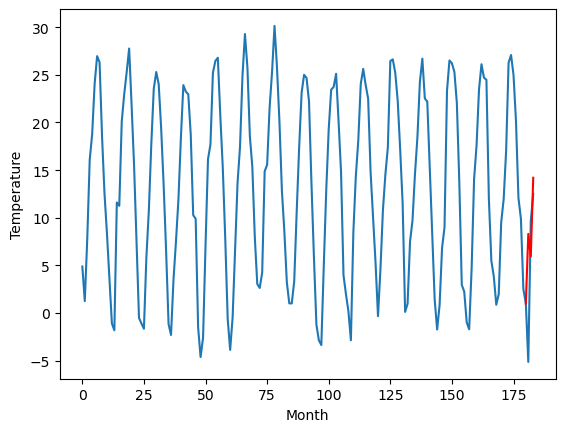

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		6.64		-1.70
11.77		4.27		-7.50
13.37		12.52		-0.85
[180, 181, 182, 183]
[14.25, 6.640702440738678, 4.267780258655548, 12.520574524402619]


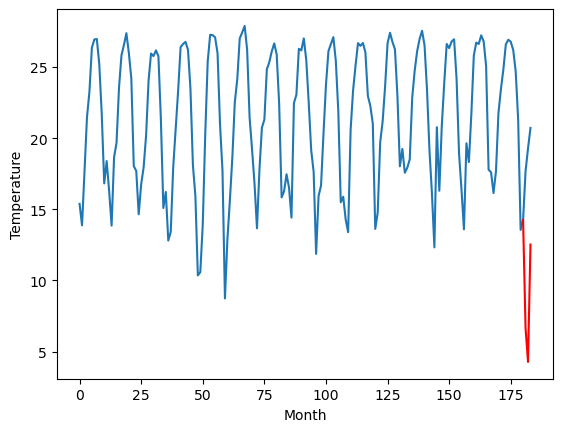

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.26		-1.03
2.37		0.87		-1.50
11.70		9.13		-2.57
[180, 181, 182, 183]
[9.06, 3.2561628913879392, 0.8749740219116209, 9.132183799743652]


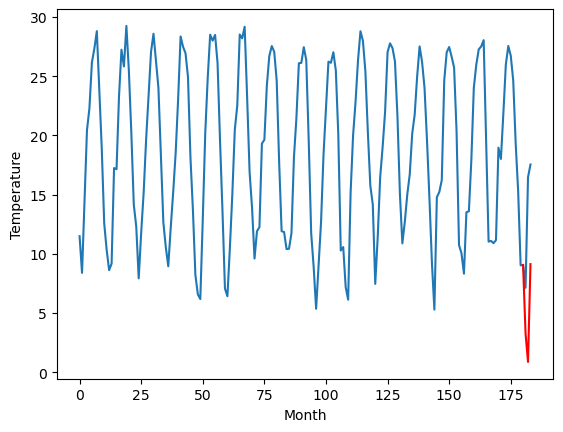

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		2.61		-0.09
-0.76		0.23		0.99
10.20		8.49		-1.71
[180, 181, 182, 183]
[7.48, 2.6137063455581666, 0.22704481601715099, 8.486907715797425]


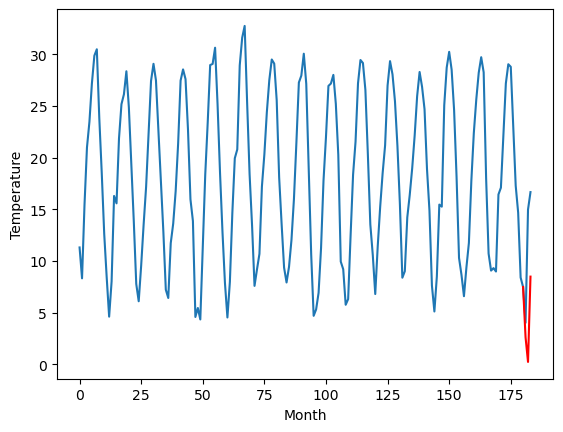

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.89		-0.40
0.40		1.50		1.10
11.32		9.75		-1.57
[180, 181, 182, 183]
[7.33, 3.8853839778900143, 1.4958557033538815, 9.753049268722535]


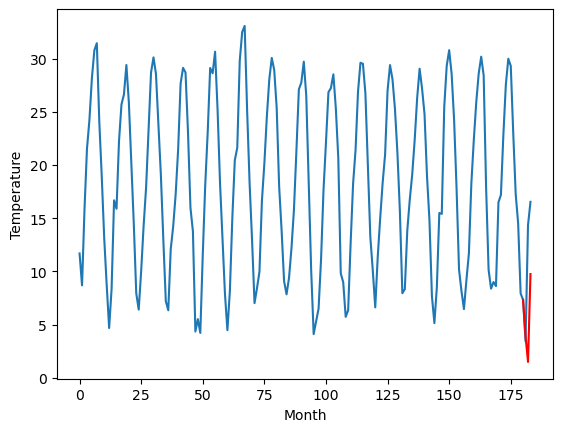

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		14.38		0.10
12.71		11.99		-0.72
21.96		20.24		-1.72
[180, 181, 182, 183]
[6.59, 14.379843955039979, 11.992459540367127, 20.239807372093203]


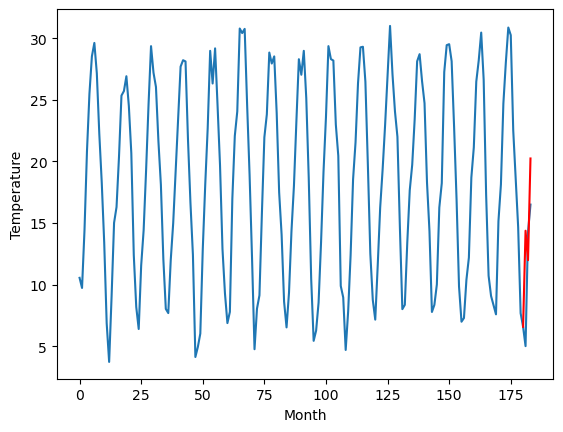

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		10.49		-1.23
12.39		8.10		-4.29
18.79		16.35		-2.44
[180, 181, 182, 183]
[6.04, 10.486508240699768, 8.101846327781677, 16.35046350002289]


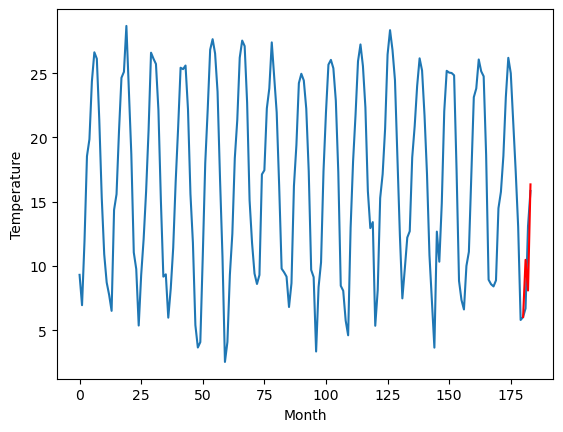

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		10.30		0.66
6.03		7.91		1.88
18.30		16.18		-2.12
[180, 181, 182, 183]
[3.13, 10.301466403007508, 7.913169560432435, 16.1786181306839]


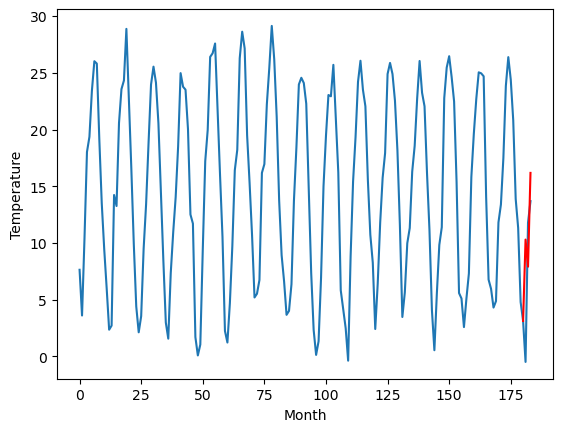

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		10.68		0.57
6.75		8.29		1.54
18.72		16.57		-2.15
[180, 181, 182, 183]
[-0.29, 10.678104224205017, 8.293376507759094, 16.56564384937286]


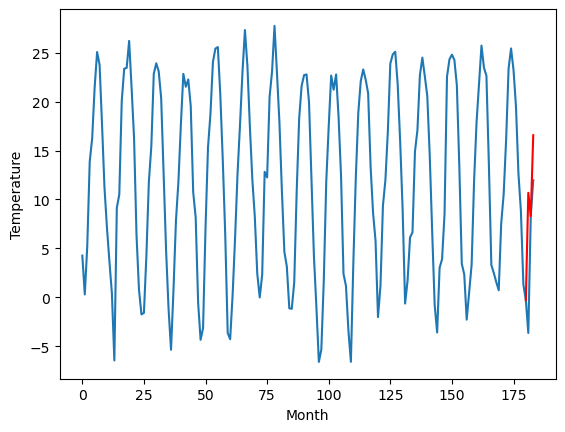

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		9.55		1.02
4.09		7.16		3.07
17.95		15.45		-2.50
[180, 181, 182, 183]
[-1.03, 9.546348152160645, 7.159693536758423, 15.445448694229126]


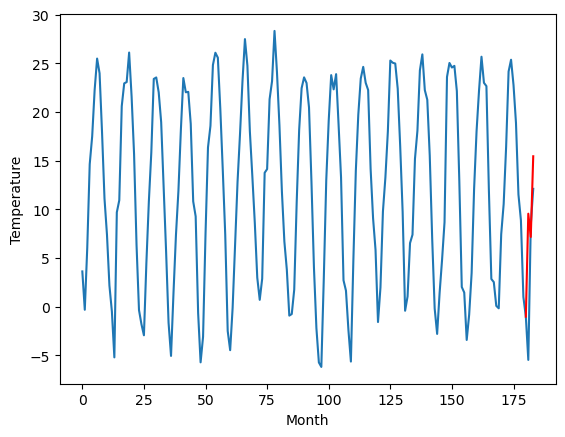

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		8.31		0.91
5.16		5.92		0.76
15.05		14.20		-0.85
[180, 181, 182, 183]
[-2.29, 8.30508644104004, 5.923870153427124, 14.19956976890564]


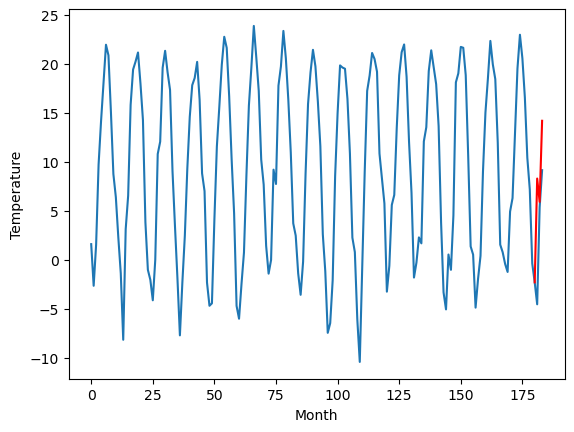

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[8.30804533481598, 6.640702440738678, 3.2561628913879392, 2.6137063455581666, 3.8853839778900143, 14.379843955039979, 10.486508240699768, 10.301466403007508, 10.678104224205017, 9.546348152160645, 8.30508644104004]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81   8.308045
1                 1    8.34   6.640702
2                 2    4.29   3.256163
3                 3    2.70   2.613706
4                 4    4.29   3.885384
5                 5   14.28  14.379844
6                 6   11.72  10.486508
7                 7    9.64  10.301466
8                 8   10.11  10.678104
9                 9    8.53   9.546348
10               10    7.40   8.305086


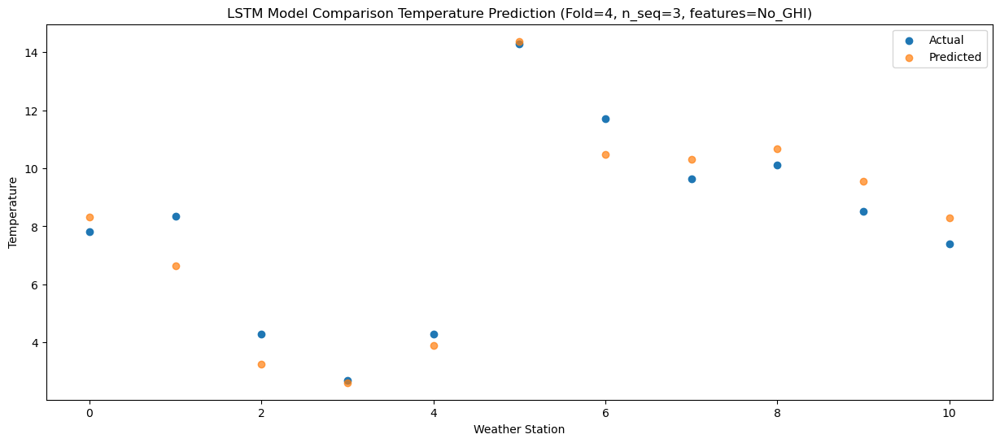

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68   5.924375
1                 1   11.77   4.267780
2                 2    2.37   0.874974
3                 3   -0.76   0.227045
4                 4    0.40   1.495856
5                 5   12.71  11.992460
6                 6   12.39   8.101846
7                 7    6.03   7.913170
8                 8    6.75   8.293377
9                 9    4.09   7.159694
10               10    5.16   5.923870


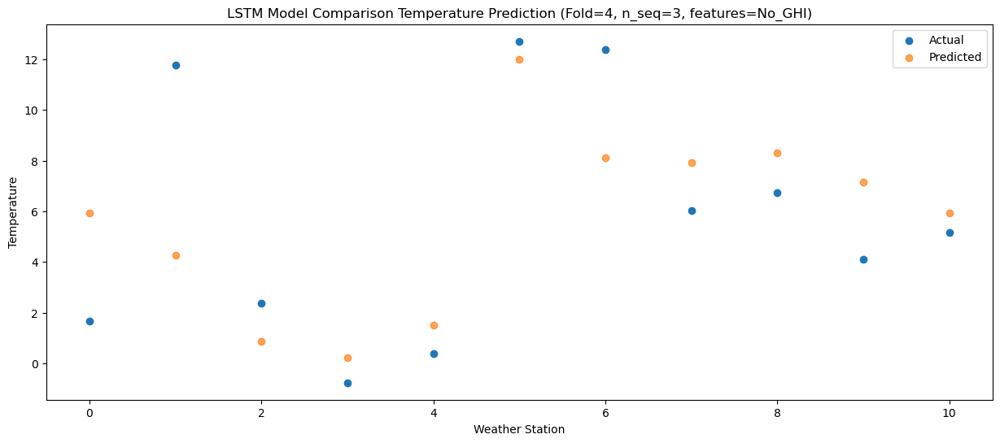

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41  14.199329
1                 1   13.37  12.520575
2                 2   11.70   9.132184
3                 3   10.20   8.486908
4                 4   11.32   9.753049
5                 5   21.96  20.239807
6                 6   18.79  16.350464
7                 7   18.30  16.178618
8                 8   18.72  16.565644
9                 9   17.95  15.445449
10               10   15.05  14.199570


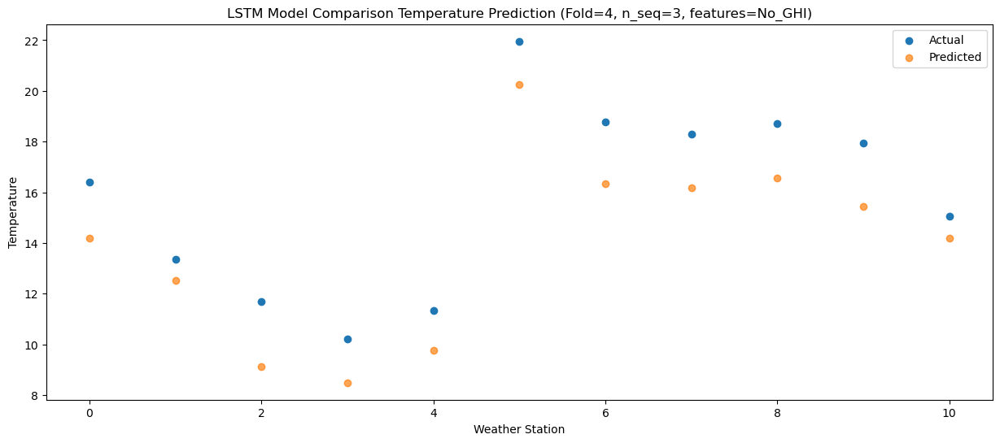

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_16 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_17 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_17 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_24 (Dense)            (1, 256)                  262400    
                                                                 
 dense_25 (Dense)            (1, 128)                  32896     
                                                                 
 dense_26 (Dense)            (1, 3)                   

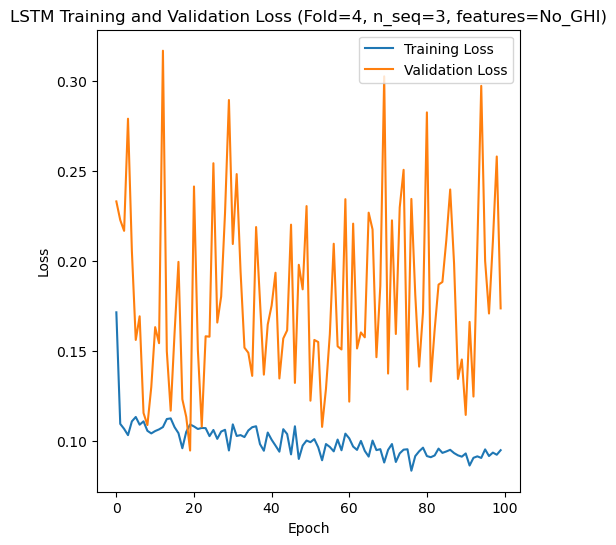

[[1.1637640068879427, 3.591796774590299, 3.506836831476432], [1.9786535341836555, 4.850947043807469, 3.4196774399031207], [1.7365104237506517, 2.809469810479739, 2.8406652986047503], [1.8594058750621212, 6.76038375155786, 2.4482306868682526], [0.880058738606463, 3.2128472646503017, 1.9688531648109904]]
[[1.0313179789348081, 2.8761731542782347, 3.352417501156981], [1.856840496063232, 4.418211161873558, 3.255044484571978], [1.4354530182751735, 2.4436988982287318, 1.8632985518195417], [1.5311162645166567, 6.0066361782767554, 1.9269924293864855], [0.7460391467267815, 2.508211397474462, 1.881673117334192]]
[[0.10863291816607386, 0.5403598041215601, 0.2104142408318647], [0.18508657219429872, 0.5069289940879572, 0.18972321938077752], [0.1863487134566106, 0.3862140622739006, 0.14317413885725663], [0.25474209820557425, 1.8294654919764497, 0.26683006591717634], [0.10120853383466787, 0.8795531957899269, 0.12357259529185578]]
[[0.7834314537106009, -0.17529063570891168, -0.6424089104905817], [0.401

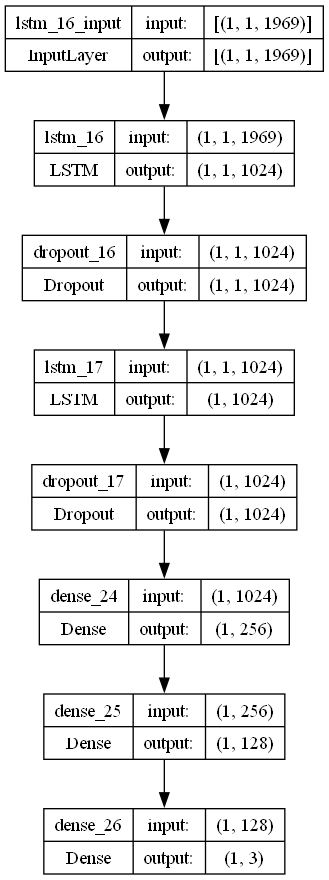

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.008663575820582508
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 1024
    dropout_rate = 0.29873396494652815

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S3_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)